# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as scs
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier 

In [2]:
# A problem with BAM Scoring
# Why should I do this in the first place?
# First thing is putting these scores into ranks
# BAM Score is a singular value for a player
# What makes a good BAM Score? 
# Turns out Vertical Jump....not important for dilineating BAM Scores 
# Reaction Shuttle
# --> fast twitch agility
# 4 way agility
# # 

In [3]:
#df.head(2)

In [4]:
# Move to bottom of notebook

In [5]:
#sns.violinplot(y='Reaction Shuttle', x='bam_score_rank', data=df)
#plt.show()

In [6]:
#sns.violinplot(y='Reaction Shuttle', x='height_rank', data=df)
#plt.show()

In [7]:
#sns.violinplot(y='Vertical Jump', x='bam_score_rank', data=df)
#plt.show()

In [8]:
#df['Vertical Jump'].plot('hist')

# Import and Clean Data

In [9]:
df = pd.read_excel('dec16-OutboundForAnalysis.xlsx')
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Length,Hand Width,Unnamed: 14,Unnamed: 15
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,7.50,8.25,NaN,NaN
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,7.50,8.75,NaN,NaN
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.00,9.50,NaN,NaN
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,8.25,9.25,NaN,NaN
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,8.00,10.00,NaN,NaN


In [10]:
#df = pd.read_csv('BAM_Updated.csv')
#df.head()

# This is what I should import for the next notebook with my analysis

In [11]:
df.columns

Index(['BAMid', 'Approach Vertical', 'Vertical Jump', '3/4 Court sprint  ',
       '4-Way agility', 'Reaction Shuttle', 'BAMScore', 'Wingspan', 'Reach',
       'Height', 'Weight', 'Body Comp', 'Hand Length', 'Hand Width',
       'Unnamed: 14', 'Unnamed: 15'],
      dtype='object')

In [12]:
df

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Length,Hand Width,Unnamed: 14,Unnamed: 15
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.00,174.4,9.8,7.50,8.25,NaN,NaN
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.50,188.4,21.9,7.50,8.75,NaN,NaN
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.00,196.5,13.9,9.00,9.50,NaN,NaN
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.50,205.0,10.6,8.25,9.25,NaN,NaN
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.00,180.0,15.4,8.00,10.00,NaN,NaN
5,490,37.0,29.0,NaN,NaN,NaN,2208.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,1508,32.0,27.5,3.21,11.276,3.047,2088.0,73.00,92.0,70.00,130.8,11.5,7.25,8.00,NaN,NaN
7,730,34.0,26.5,3.513,11.743,3.726,1888.0,76.00,97.5,75.50,181.9,7.6,8.00,8.25,NaN,NaN
8,413,NaN,34.0,3.263,12.644,3.498,1932.0,76.00,95.5,73.00,157.3,16.3,7.00,8.25,NaN,NaN
9,1003,NaN,14.0,3.407,11.947,3.448,1709.0,83.00,102.0,76.50,197.3,23.2,8.00,9.25,NaN,NaN


In [13]:
#drop last 2 columns because they are messing up data

df.drop(columns=['Unnamed: 14','Unnamed: 15','Hand Length'],inplace=True)

In [14]:
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00


# EDA and Rankings on each parameter

### Bam Score Rank : 1 = best | 5 = worst
### Paramater Ranks : 5 = best | 1 = worst

## EDA - (1) Approach Vertical

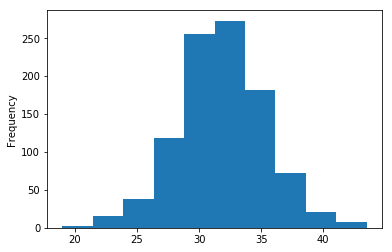

In [15]:
df['Approach Vertical'].plot('hist')

In [16]:
df['Approach Vertical'].describe(), 

(count    986.000000
 mean      31.829615
 std        3.547985
 min       19.000000
 25%       29.500000
 50%       31.750000
 75%       34.000000
 max       43.500000
 Name: Approach Vertical, dtype: float64,)

In [17]:
approach_mu = df['Approach Vertical'].mean()
approach_std = df['Approach Vertical'].std()

min95 = approach_mu-2*approach_std
max95 = approach_mu+2*approach_std


def get_rank_approach_vertical(vert):
    if vert > approach_mu+1*approach_std:
        return 5
    if vert > approach_mu:
        return 4
    if vert > approach_mu - approach_std:
        return 3
    if vert > approach_mu - 2*approach_std:
        return 2
    return 1

In [18]:
df['approach_vertical_rank'] = df['Approach Vertical'].apply(get_rank_approach_vertical)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3


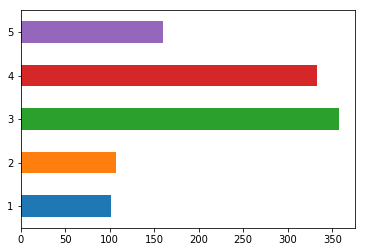

In [19]:
# object
# attributes (properties, adjectives)
# methods (verbs)

# object.attributes
# object.method()

av_rank_counts = pd.value_counts(df['approach_vertical_rank'].values, sort=False)
av_rank_counts.plot.barh()


In [20]:
# Observation

## EDA - (2) Vertical Jump

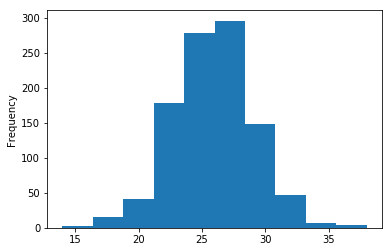

In [21]:
df['Vertical Jump'].plot('hist')

In [22]:
df['Vertical Jump'].describe(), 

(count    1019.000000
 mean       25.860157
 std         3.125301
 min        14.000000
 25%        24.000000
 50%        25.500000
 75%        28.000000
 max        38.000000
 Name: Vertical Jump, dtype: float64,)

In [23]:
vertical_mu = df['Vertical Jump'].mean()
vertical_std = df['Vertical Jump'].std()

min95 = vertical_mu-2*vertical_std
max95 = vertical_mu+2*vertical_std


def get_rank_vertical_jump(vert):
    if vert > vertical_mu+1*vertical_std:
        return 5
    if vert > vertical_mu:
        return 4
    if vert > vertical_mu - vertical_std:
        return 3
    if vert > vertical_mu - 2*vertical_std:
        return 2
    return 1

In [24]:
df['vertical_jump_rank'] = df['Vertical Jump'].apply(get_rank_vertical_jump)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4


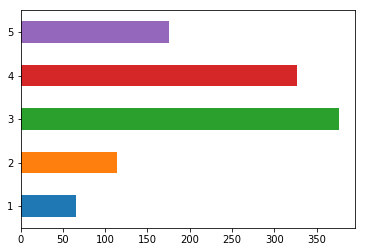

In [25]:
av_rank_counts_vert_jump = pd.value_counts(df['vertical_jump_rank'].values, sort=False)
av_rank_counts_vert_jump.plot.barh()

In [26]:
# Observations

## EDA - (3) Reaction Shuttle

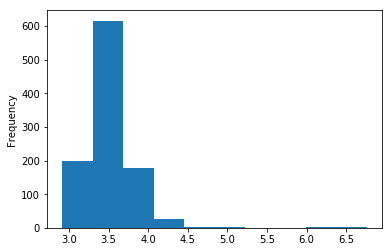

In [27]:
df['Reaction Shuttle'].plot('hist')

In [28]:
df['Reaction Shuttle'].describe(), 

(count    1024.000000
 mean        3.505243
 std         0.278427
 min         2.914000
 25%         3.343750
 50%         3.484000
 75%         3.642250
 max         6.759000
 Name: Reaction Shuttle, dtype: float64,)

In [29]:
shuttle_mu = df['Reaction Shuttle'].mean()
shuttle_std = df['Reaction Shuttle'].std()

min95 = shuttle_mu-2*shuttle_std
max95 = shuttle_mu+2*shuttle_std


def get_rank_reaction_shuttle(shut):
    if shut > shuttle_mu+1*shuttle_std:
        return 5
    if shut > shuttle_mu:
        return 4
    if shut > shuttle_mu - shuttle_std:
        return 3
    if shut > shuttle_mu - 2*shuttle_std:
        return 2
    return 1

In [30]:
df['reaction_shuttle_rank'] = df['Reaction Shuttle'].apply(get_rank_reaction_shuttle)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3


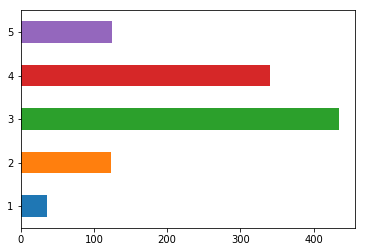

In [31]:
av_rank_counts_shuttle = pd.value_counts(df['reaction_shuttle_rank'].values, sort=False)
av_rank_counts_shuttle.plot.barh()

In [32]:
# Observations - need to take outliers out and re weigh/balance data

## EDA - (4) BAM Score

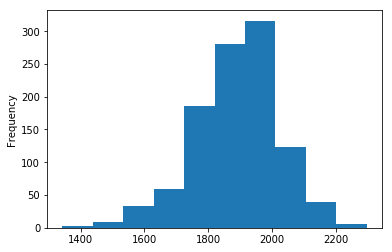

In [33]:
df['BAMScore'].plot('hist')

In [34]:
df['BAMScore'].describe(), 

(count    1056.000000
 mean     1890.976326
 std       135.057644
 min      1343.000000
 25%      1811.000000
 50%      1899.500000
 75%      1981.250000
 max      2298.000000
 Name: BAMScore, dtype: float64,)

In [35]:
bam_mu = df['BAMScore'].mean()
bam_std = df['BAMScore'].std()

min95 = bam_mu-2*bam_std
max95 = bam_mu+2*bam_std


def get_rank_bam_score(bam):
    if bam > bam_mu+1*bam_std:
        return 5
    if bam > bam_mu:
        return 4
    if bam > bam_mu - bam_std:
        return 3
    if bam > bam_mu - 2*bam_std:
        return 2
    return 1

In [36]:
df['bam_score_rank'] = df['BAMScore'].apply(get_rank_bam_score)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4


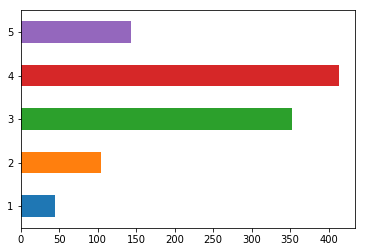

In [37]:
av_rank_bam_score = pd.value_counts(df['bam_score_rank'].values, sort=False)
av_rank_bam_score.plot.barh()

In [38]:
# Observations - A lot of values in 4 and 3 rank - Maybe break up into 10 ranks. We see a very normal distribution here.

## EDA - (5) Wingspan

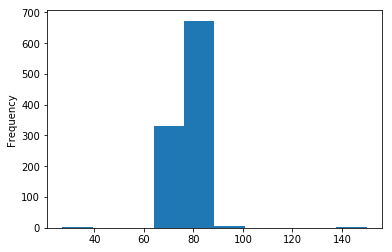

In [39]:
df['Wingspan'].plot('hist')

In [40]:
df['Wingspan'].describe(), 

(count    1012.000000
 mean       78.089797
 std         5.261419
 min        27.000000
 25%        75.500000
 50%        78.000000
 75%        80.500000
 max       150.000000
 Name: Wingspan, dtype: float64,)

In [41]:
wingspan_mu = df['Wingspan'].mean()
wingspan_std = df['Wingspan'].std()

min95 = wingspan_mu-2*wingspan_std
max95 = wingspan_mu+2*wingspan_std


def get_rank_wingspan(wing):
    if wing > wingspan_mu+1*wingspan_std:
        return 5
    if wing > wingspan_mu:
        return 4
    if wing > wingspan_mu - wingspan_std:
        return 3
    if wing > wingspan_mu - 2*wingspan_std:
        return 2
    return 1

In [42]:
df['wingspan_rank'] = df['Wingspan'].apply(get_rank_wingspan)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3


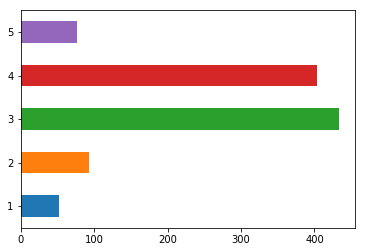

In [43]:
av_rank_wingspan = pd.value_counts(df['wingspan_rank'].values, sort=False)
av_rank_wingspan.plot.barh()

## EDA - (6) Reach

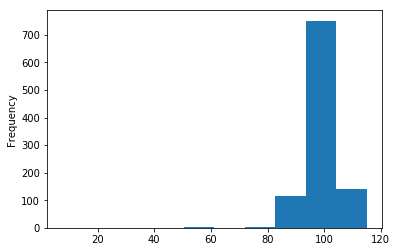

In [44]:
df['Reach'].plot('hist')

In [45]:
df['Reach'].describe(), 

(count    1012.000000
 mean       98.714180
 std         5.958459
 min         7.500000
 25%        95.500000
 50%        99.000000
 75%       102.000000
 max       115.000000
 Name: Reach, dtype: float64,)

In [46]:
reach_mu = df['Reach'].mean()
reach_std = df['Reach'].std()

min95 = reach_mu-2*reach_std
max95 = reach_mu+2*reach_std


def get_rank_reach(reach):
    if reach > reach_mu+1*reach_std:
        return 5
    if reach > reach_mu:
        return 4
    if reach > reach_mu - reach_std:
        return 3
    if reach > reach_mu - 2*reach_std:
        return 2
    return 1

In [47]:
df['reach_rank'] = df['Reach'].apply(get_rank_reach)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4,4
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3,4


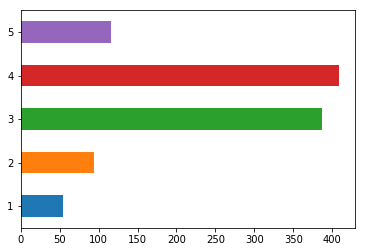

In [48]:
av_rank_reach = pd.value_counts(df['reach_rank'].values, sort=False)
av_rank_reach.plot.barh()

In [49]:
# Observations

## EDA - (7) Height

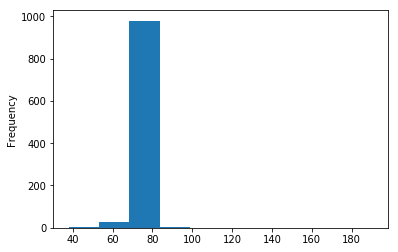

In [50]:
df['Height'].plot('hist')

In [51]:
df['Height'].describe(), 

(count    1012.000000
 mean       75.094195
 std         5.246045
 min        37.875000
 25%        72.500000
 50%        75.000000
 75%        77.500000
 max       190.700000
 Name: Height, dtype: float64,)

In [52]:
height_mu = df['Height'].mean()
height_std = df['Height'].std()

min95 = height_mu-2*height_std
max95 = height_mu+2*height_std


def get_rank_height(height):
    if height > height_mu+1*height_std:
        return 5
    if height > height_mu:
        return 4
    if height > height_mu - height_std:
        return 3
    if height > height_mu - 2*height_std:
        return 2
    return 1

In [53]:
df['height_rank'] = df['Height'].apply(get_rank_height)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,174.4,9.8,8.25,4,4,4,4,2,3,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,188.4,21.9,8.75,3,2,3,3,4,4,4
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,196.5,13.9,9.50,5,5,4,4,4,4,3
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,205.0,10.6,9.25,3,3,2,4,4,4,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,180.0,15.4,10.00,3,4,3,4,3,4,4


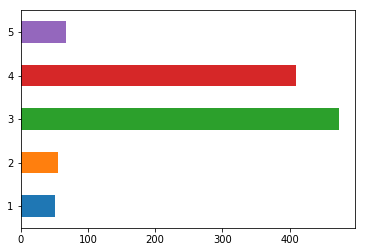

In [54]:
av_rank_height = pd.value_counts(df['height_rank'].values, sort=False)
av_rank_height.plot.barh()

In [55]:
# Observations

## EDA - (8) Weight

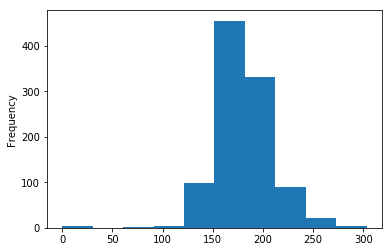

In [56]:
df['Weight'].plot('hist')

In [57]:
df['Weight'].describe(), 

(count    1012.000000
 mean      180.735820
 std        28.646001
 min         0.000000
 25%       164.475000
 50%       178.400000
 75%       196.000000
 max       303.400000
 Name: Weight, dtype: float64,)

In [58]:
weight_mu = df['Weight'].mean()
weight_std = df['Weight'].std()

min95 = weight_mu-2*weight_std
max95 = weight_mu+2*weight_std


def get_rank_weight(weight):
    if weight > weight_mu+1*weight_std:
        return 5
    if weight > weight_mu:
        return 4
    if weight > weight_mu - weight_std:
        return 3
    if weight > weight_mu - 2*weight_std:
        return 2
    return 1

In [59]:
df['weight_rank'] = df['Weight'].apply(get_rank_weight)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,...,Body Comp,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,...,9.8,8.25,4,4,4,4,2,3,3,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,...,21.9,8.75,3,2,3,3,4,4,4,4
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,...,13.9,9.50,5,5,4,4,4,4,3,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,...,10.6,9.25,3,3,2,4,4,4,4,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,...,15.4,10.00,3,4,3,4,3,4,4,3


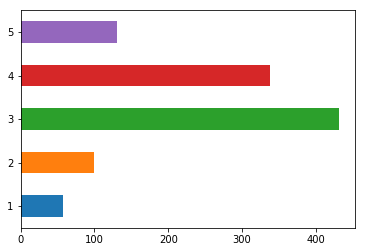

In [60]:
av_rank_weight = pd.value_counts(df['weight_rank'].values, sort=False)
av_rank_weight.plot.barh()

In [61]:
# Observations

## EDA - (9) Body Comp

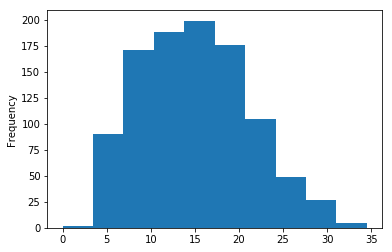

In [62]:
df['Body Comp'].plot('hist')

In [63]:
df['Body Comp'].describe(), 

(count    1012.000000
 mean       14.979496
 std         6.191147
 min         0.000000
 25%        10.200000
 50%        14.700000
 75%        19.200000
 max        34.500000
 Name: Body Comp, dtype: float64,)

In [64]:
body_comp_mu = df['Body Comp'].mean()
body_comp_std = df['Body Comp'].std()

min95 = body_comp_mu-2*body_comp_std
max95 = body_comp_mu+2*body_comp_std


def get_rank_body_comp(body):
    if body > body_comp_mu+1*wingspan_std:
        return 5
    if body > body_comp_mu:
        return 4
    if body > body_comp_mu - body_comp_std:
        return 3
    if body > body_comp_mu - 2*body_comp_std:
        return 2
    return 1

In [65]:
df['body_comp_rank'] = df['Body Comp'].apply(get_rank_body_comp)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,...,Hand Width,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,...,8.25,4,4,4,4,2,3,3,3,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,...,8.75,3,2,3,3,4,4,4,4,5
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,...,9.50,5,5,4,4,4,4,3,4,3
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,...,9.25,3,3,2,4,4,4,4,4,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,...,10.00,3,4,3,4,3,4,4,3,4


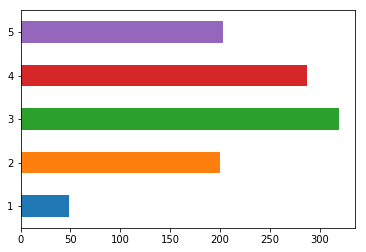

In [66]:
av_rank_body_comp = pd.value_counts(df['body_comp_rank'].values, sort=False)
av_rank_body_comp.plot.barh()

In [67]:
# Observations

## EDA - (10) Hand Width

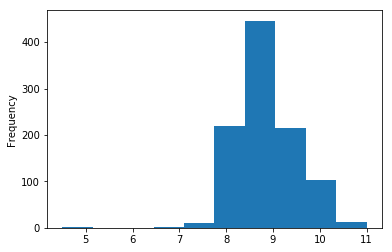

In [68]:
df['Hand Width'].plot('hist')

In [69]:
df['Hand Width'].describe(), 

(count    1009.000000
 mean        8.876189
 std         0.654095
 min         4.500000
 25%         8.500000
 50%         9.000000
 75%         9.250000
 max        11.000000
 Name: Hand Width, dtype: float64,)

In [70]:
hand_width_mu = df['Hand Width'].mean()
hand_width_std = df['Hand Width'].std()

min95 = hand_width_mu-2*hand_width_std
max95 = hand_width_mu+2*hand_width_std


def get_rank_hand_width(handwidth):
    if handwidth > hand_width_mu+1*hand_width_std:
        return 5
    if handwidth > hand_width_mu:
        return 4
    if handwidth > hand_width_mu - hand_width_std:
        return 3
    if handwidth > hand_width_mu - 2*hand_width_std:
        return 2
    return 1

In [71]:
df['hand_width_rank'] = df['Hand Width'].apply(get_rank_hand_width)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,...,approach_vertical_rank,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,...,4,4,4,4,2,3,3,3,3,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,...,3,2,3,3,4,4,4,4,5,3
2,477,37.0,31.0,3.23,12.036,3.562,2005.0,81.50,99.0,74.0,...,5,5,4,4,4,4,3,4,3,4
3,1200,29.0,23.0,3.37,12.509,3.173,1902.0,79.50,101.0,77.5,...,3,3,2,4,4,4,4,4,3,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,...,3,4,3,4,3,4,4,3,4,5


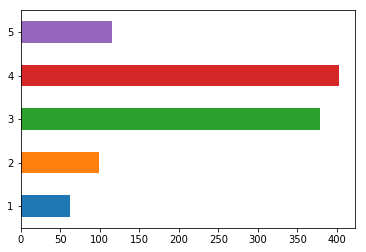

In [72]:
av_rank_hand_width = pd.value_counts(df['hand_width_rank'].values, sort=False)
av_rank_hand_width.plot.barh()

## Cleaning - (11) 3/4 Court Sprint

In [73]:
#df['3/4 Court sprint  '] = df['3/4 Court sprint  '].astype(float)

In [74]:
for index,col in enumerate(df['3/4 Court sprint  ']):
    try:
        float(col)
    except ValueError:
        print (index,col)

371  
377  
391  
417  
616  
653  
879  
968  


In [75]:
df.loc[371, '3/4 Court sprint  ']

' '

In [76]:
df['3/4 Court sprint  '] = df['3/4 Court sprint  '].replace(' ',np.NaN)
df['3/4 Court sprint  ']

0       3.376
1       3.486
2       3.230
3       3.370
4       3.389
5         NaN
6       3.210
7       3.513
8       3.263
9       3.407
10      3.396
11      3.267
12      3.505
13      3.512
14      3.286
15      3.648
16      3.556
17      3.560
18      6.764
19      3.431
20      3.286
21      4.007
22      3.481
23      3.362
24      3.180
25      3.501
26      3.667
27      3.383
28      3.262
29      3.481
        ...  
1029    3.511
1030      NaN
1031    3.530
1032    3.386
1033    3.307
1034    3.553
1035    3.426
1036    3.286
1037    3.433
1038    3.268
1039    3.498
1040    3.425
1041    3.693
1042    3.531
1043    3.190
1044    3.754
1045    3.612
1046    3.413
1047    3.428
1048    3.418
1049    3.332
1050    3.282
1051    3.569
1052    3.327
1053    3.512
1054    3.424
1055    3.256
1056      NaN
1057      NaN
1058      NaN
Name: 3/4 Court sprint  , Length: 1059, dtype: float64

In [77]:
x = df.drop(columns=['BAMid', 'BAMScore','bam_score_rank','approach_vertical_rank', 'vertical_jump_rank',
       'reaction_shuttle_rank','wingspan_rank','reach_rank','height_rank','weight_rank','body_comp_rank','hand_width_rank'])
y = df[['bam_score_rank']]

In [78]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059 entries, 0 to 1058
Data columns (total 11 columns):
Approach Vertical     986 non-null float64
Vertical Jump         1019 non-null float64
3/4 Court sprint      1018 non-null float64
4-Way agility         1020 non-null object
Reaction Shuttle      1024 non-null float64
Wingspan              1012 non-null float64
Reach                 1012 non-null float64
Height                1012 non-null float64
Weight                1012 non-null float64
Body Comp             1012 non-null float64
Hand Width            1009 non-null float64
dtypes: float64(10), object(1)
memory usage: 91.1+ KB


In [79]:
x = x.replace(to_replace=['Nan','NAN'], value=np.nan)

In [80]:
x = x.fillna(x.mean())
# FORMULA = df.fillna(df.mean())

In [81]:
x.isnull().sum()

Approach Vertical      0
Vertical Jump          0
3/4 Court sprint       0
4-Way agility         39
Reaction Shuttle       0
Wingspan               0
Reach                  0
Height                 0
Weight                 0
Body Comp              0
Hand Width             0
dtype: int64

## Cleaning - (12) 4-Way Agility

In [82]:
#df['4-Way agility'] = df['4-Way agility'].astype(float)

In [83]:
for index,col in enumerate(df['4-Way agility']):
    try:
        float(col)
    except ValueError:
        print (index,col)

377  
391  
417  
430  
529  
534  
616  
653  
879  
986  


In [84]:
df.loc[377,'4-Way agility']

' '

In [85]:
df['4-Way agility'] = df['4-Way agility'].replace(' ',np.NaN)
df['4-Way agility']

0       11.471
1       12.114
2       12.036
3       12.509
4       12.724
5          NaN
6       11.276
7       11.743
8       12.644
9       11.947
10      11.387
11      11.746
12      12.183
13      12.407
14      11.612
15      12.189
16      12.306
17      11.511
18      13.966
19      12.645
20      12.167
21      13.597
22      11.063
23      12.714
24      12.137
25      11.624
26      12.102
27      13.418
28      12.152
29      12.761
         ...  
1029    11.751
1030       NaN
1031    13.639
1032    13.077
1033    11.472
1034    13.215
1035    10.988
1036    11.318
1037    12.542
1038    11.797
1039    11.940
1040    13.262
1041    13.350
1042    12.798
1043    12.740
1044    12.507
1045    12.122
1046    13.878
1047    11.764
1048    11.727
1049    12.938
1050    12.235
1051    11.702
1052    12.053
1053    12.484
1054    12.654
1055    11.136
1056       NaN
1057       NaN
1058       NaN
Name: 4-Way agility, Length: 1059, dtype: float64

In [86]:
x = df.drop(columns=['BAMid', 'BAMScore','bam_score_rank','approach_vertical_rank', 'vertical_jump_rank',
       'reaction_shuttle_rank','wingspan_rank','reach_rank','height_rank','weight_rank','body_comp_rank','hand_width_rank'])
y = df[['bam_score_rank']]

In [87]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1059 entries, 0 to 1058
Data columns (total 11 columns):
Approach Vertical     986 non-null float64
Vertical Jump         1019 non-null float64
3/4 Court sprint      1018 non-null float64
4-Way agility         1010 non-null float64
Reaction Shuttle      1024 non-null float64
Wingspan              1012 non-null float64
Reach                 1012 non-null float64
Height                1012 non-null float64
Weight                1012 non-null float64
Body Comp             1012 non-null float64
Hand Width            1009 non-null float64
dtypes: float64(11)
memory usage: 91.1 KB


In [88]:
x = x.replace(to_replace=['Nan','NAN'], value=np.nan)

In [89]:
x = x.fillna(x.mean())
# FORMULA = df.fillna(df.mean())

In [90]:
x.isnull().sum()

Approach Vertical     0
Vertical Jump         0
3/4 Court sprint      0
4-Way agility         0
Reaction Shuttle      0
Wingspan              0
Reach                 0
Height                0
Weight                0
Body Comp             0
Hand Width            0
dtype: int64

## EDA (12) - 4-Way agility

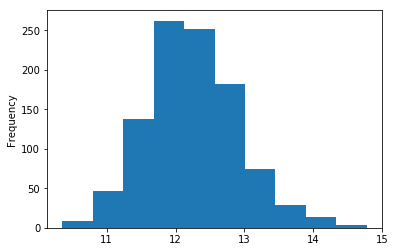

In [91]:
df['4-Way agility'].plot('hist')

In [92]:
df['4-Way agility'].describe(),

(count    1010.000000
 mean       12.247189
 std         0.668387
 min        10.359000
 25%        11.779250
 50%        12.199000
 75%        12.676750
 max        14.775000
 Name: 4-Way agility, dtype: float64,)

In [93]:
fourway_mu = df['4-Way agility'].mean()
fourway_std = df['4-Way agility'].std()

min95 = fourway_mu-2*fourway_std
max95 = fourway_mu+2*fourway_std


def get_rank_fourway(four):
    if four > fourway_mu+1*fourway_std:
        return 5
    if four > fourway_mu:
        return 4
    if four > fourway_mu - fourway_std:
        return 3
    if four > fourway_mu - 2*fourway_std:
        return 2
    return 1

In [94]:
df['fourway_rank'] = df['4-Way agility'].apply(get_rank_fourway)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,...,vertical_jump_rank,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,...,4,4,4,2,3,3,3,3,3,2
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,...,2,3,3,4,4,4,4,5,3,3
2,477,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.0,...,5,4,4,4,4,3,4,3,4,3
3,1200,29.0,23.0,3.370,12.509,3.173,1902.0,79.50,101.0,77.5,...,3,2,4,4,4,4,4,3,4,4
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,...,4,3,4,3,4,4,3,4,5,4


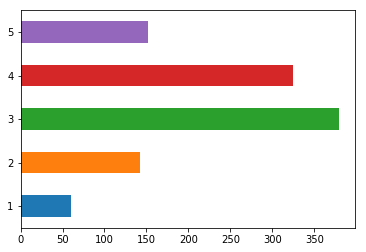

In [95]:
av_rank_counts_fourway = pd.value_counts(df['fourway_rank'].values, sort=False)
av_rank_counts_fourway.plot.barh()

## EDA - 3/4 Court Sprint

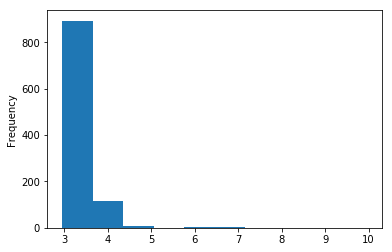

In [96]:
df['3/4 Court sprint  '].plot('hist')

In [97]:
df['3/4 Court sprint  '].describe(),

(count    1018.000000
 mean        3.467047
 std         0.342199
 min         2.950000
 25%         3.335000
 50%         3.419000
 75%         3.545000
 max         9.954000
 Name: 3/4 Court sprint  , dtype: float64,)

In [98]:
courtsprint_mu = df['3/4 Court sprint  '].mean()
courtsprint_std = df['3/4 Court sprint  '].std()

min95 = courtsprint_mu-2*courtsprint_std
max95 = courtsprint_mu+2*courtsprint_std


def get_rank_courtsprint(court):
    if court > courtsprint_mu+1*courtsprint_std:
        return 5
    if court > courtsprint_mu:
        return 4
    if court > courtsprint_mu - courtsprint_std:
        return 3
    if court > courtsprint_mu - 2*courtsprint_std:
        return 2
    return 1

In [99]:
df['courtsprint_rank'] = df['3/4 Court sprint  '].apply(get_rank_courtsprint)
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,...,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,...,4,4,2,3,3,3,3,3,2,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,...,3,3,4,4,4,4,5,3,3,4
2,477,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.0,...,4,4,4,4,3,4,3,4,3,3
3,1200,29.0,23.0,3.370,12.509,3.173,1902.0,79.50,101.0,77.5,...,2,4,4,4,4,4,3,4,4,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,...,3,4,3,4,4,3,4,5,4,3


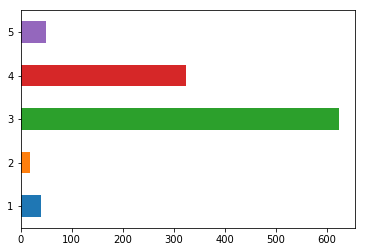

In [100]:
av_rank_counts_courtsprint = pd.value_counts(df['courtsprint_rank'].values, sort=False)
av_rank_counts_courtsprint.plot.barh()

# Random Forest Classifier

In [101]:
rf = RandomForestClassifier()
rf.fit (x,y)

#find string in data that is messing it up

//anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [102]:
print(x.columns)
print(rf.feature_importances_)

Index(['Approach Vertical', 'Vertical Jump', '3/4 Court sprint  ',
       '4-Way agility', 'Reaction Shuttle', 'Wingspan', 'Reach', 'Height',
       'Weight', 'Body Comp', 'Hand Width'],
      dtype='object')
[0.11731937 0.11082525 0.15974068 0.17365913 0.18853545 0.03612993
 0.0435834  0.03958151 0.04763903 0.04928178 0.03370447]


In [103]:
# See my accuracy and add this

# Feature Importance Analysis

In [104]:
# This tells us which feature is the most important for BAM Score.

Text(0, 0.5, 'Feature Importance')

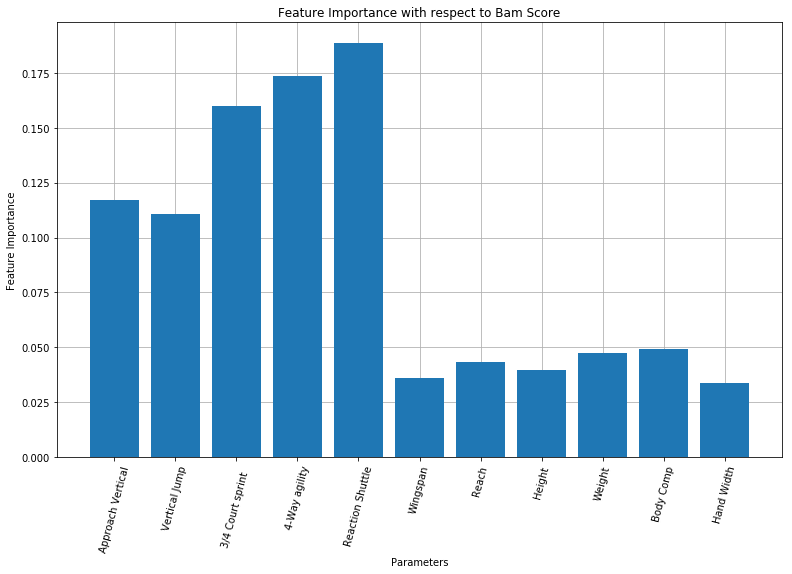

In [105]:
values = rf.feature_importances_
names = x.columns
plt.figure(figsize=(13,8))
plt.grid(zorder=0)
plt.bar(names,values,zorder=2)
plt.xticks(rotation=75)
plt.show

plt.title('Feature Importance with respect to Bam Score')
plt.xlabel('Parameters')
plt.ylabel('Feature Importance')

In [106]:
df_cleaned = x.copy()

In [107]:
df_cleaned['bam_score'] = y
df_cleaned.head(2)

,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,Wingspan,Reach,Height,Weight,Body Comp,Hand Width,bam_score
0,33.5,28.5,3.376,11.471,3.669,72.75,94.0,70.0,174.4,9.8,8.25,4
1,30.5,21.5,3.486,12.114,3.355,82.00,104.5,79.5,188.4,21.9,8.75,3


//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


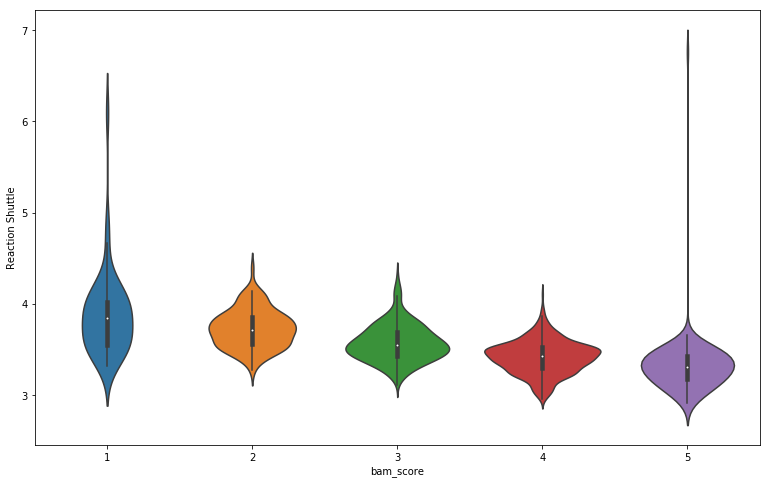

In [108]:
plt.figure(figsize=(13, 8))
sns.violinplot(x='bam_score', y='Reaction Shuttle', data=df_cleaned)
plt.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


<Figure size 576x360 with 0 Axes>

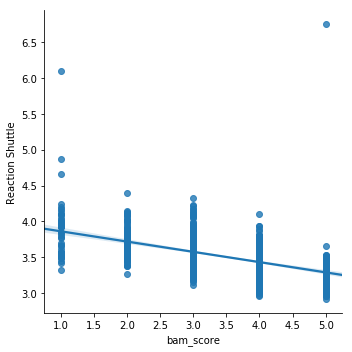

In [109]:
plt.figure(figsize=(8, 5))
sns.lmplot(x='bam_score', y='Reaction Shuttle', data=df_cleaned)
plt.show()

In [110]:
#reaction shuttle is the highiest dilineator for their rank

# Scatter Matrix to visualize trends

In [111]:
ranked_columns = []

for col in df.columns:
    if col.endswith('rank'):
        ranked_columns.append(col)
ranked_columns

['approach_vertical_rank',
 'vertical_jump_rank',
 'reaction_shuttle_rank',
 'bam_score_rank',
 'wingspan_rank',
 'reach_rank',
 'height_rank',
 'weight_rank',
 'body_comp_rank',
 'hand_width_rank',
 'fourway_rank',
 'courtsprint_rank']

In [112]:
# Endswith method has to reference a string. Formula is col.endswith('')

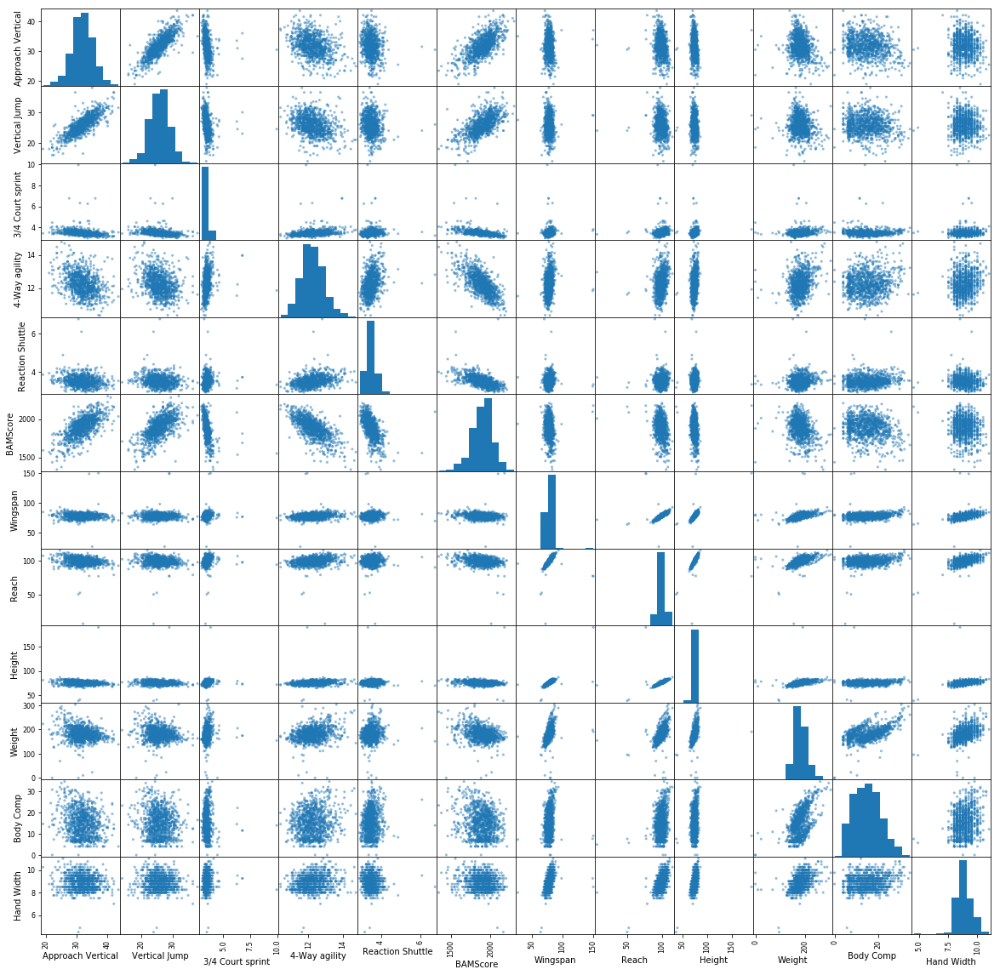

In [113]:
# Make scatter matrix to visualize 
# WHAT THE FUCK HELP
pd.plotting.scatter_matrix(df.drop(columns=ranked_columns), figsize=(20,20))
plt.show()

#df.drop('courtsprint_rank','fourway_rank')

In [114]:
df.to_csv('BAM_Updated.csv',index=False)

# This is what I should import for the next notebook with my analysis

In [115]:
df=pd.read_csv("BAM_Updated.csv")
df.head()

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,...,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.0,...,4,4,2,3,3,3,3,3,2,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.5,...,3,3,4,4,4,4,5,3,3,4
2,477,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.0,...,4,4,4,4,3,4,3,4,3,3
3,1200,29.0,23.0,3.370,12.509,3.173,1902.0,79.50,101.0,77.5,...,2,4,4,4,4,4,3,4,4,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.0,...,3,4,3,4,4,3,4,5,4,3


## Violin Plots for bam_score_rank with respect to each paramater

In [116]:
import plotly.express as px

### Violin Plot for bam_score_rank with respect to Approach Vertical

In [212]:
df.loc[(df.bam_score_rank == 2) & (df.height_rank == 2)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,...,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
168,956,22.5,17.5,3.424,13.712,3.378,1665.0,71.0,91.0,69.25,...,3,2,2,2,2,2,2,2,5,3
727,1066,30.0,22.0,3.488,13.335,3.555,1754.0,68.0,87.5,67.00,...,4,2,2,2,2,2,2,2,5,4


In [117]:
fig = px.violin(df, y="Approach Vertical", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



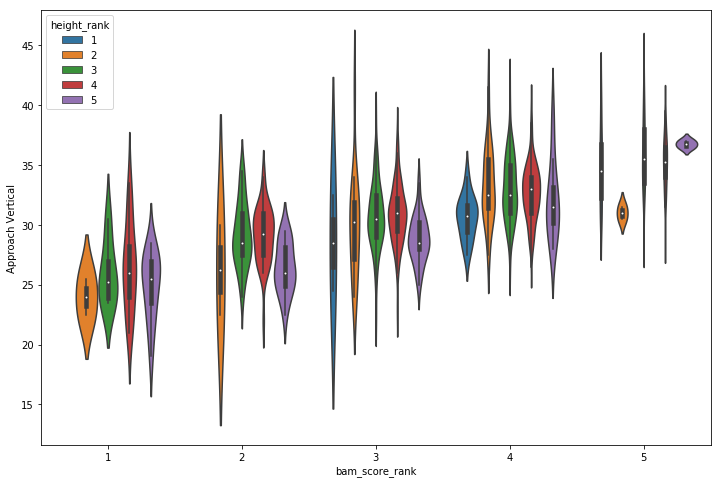

In [118]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Approach Vertical',hue='height_rank',data=df)
plt.show()

### Violin Plot for bam_score_rank with respect to Vertical Jump

In [119]:
fig = px.violin(df, y="Vertical Jump", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

# https://plotly.com/python/violin/

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



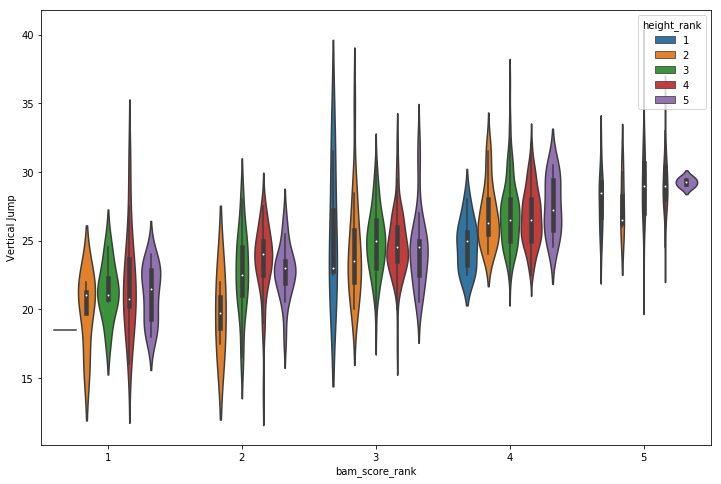

In [120]:
# Violin plot - different style

plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Vertical Jump',hue='height_rank',data=df)
plt.show()

### Violin Plots for bam_score_rank with respect to 3/4 Court sprint

In [215]:
df.loc[(df.bam_score_rank == 1) & (df.height_rank == 3)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,...,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
211,265,27.500000,21.5,3.841,12.957,4.205,1536.0,75.0,93.5,73.00,...,5,1,3,3,3,3,4,4,5,5
233,1376,30.500000,24.5,9.954,11.860,3.318,1552.0,75.0,94.0,71.50,...,3,1,3,3,3,3,3,3,3,5
436,579,31.829615,23.0,3.702,13.133,3.813,1604.0,81.0,99.5,73.00,...,5,1,4,4,3,5,5,4,5,4
487,1033,23.500000,20.5,3.424,14.111,4.171,1507.0,76.5,98.0,74.75,...,5,1,3,3,3,4,3,3,5,3
507,437,25.000000,21.0,3.757,14.775,3.448,1571.0,77.5,96.0,73.50,...,3,1,3,3,3,2,4,2,5,4
519,813,23.500000,18.0,4.060,13.835,3.484,1511.0,78.0,97.0,73.50,...,3,1,3,3,3,5,5,3,5,5
621,528,25.500000,21.0,3.744,13.447,4.098,1543.0,76.0,99.0,74.00,...,5,1,3,4,3,3,3,3,5,4


In [220]:
df.loc[(df.bam_score_rank == 2) & (df.height_rank == 3)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,...,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
18,531,27.500000,23.000000,6.764000,13.966000,3.714,1690.0,77.00,97.5,72.75,...,4,2,3,3,3,3,3,4,5,5
19,607,27.000000,22.000000,3.431000,12.645000,3.718,1750.0,76.00,97.0,72.75,...,4,2,3,3,3,3,2,3,4,3
49,910,24.000000,17.000000,3.684000,11.901000,3.614,1686.0,76.00,98.5,72.50,...,4,2,3,3,3,4,5,2,3,4
66,895,27.500000,22.500000,3.653000,12.970000,3.484,1750.0,75.75,96.0,73.50,...,3,2,3,3,3,4,3,3,5,4
105,687,28.500000,22.000000,3.651000,12.287000,3.820,1724.0,73.50,94.5,72.00,...,5,2,3,3,3,2,2,3,4,4
122,1246,31.000000,25.500000,4.470000,11.867000,3.472,1719.0,75.75,98.0,73.00,...,3,2,3,3,3,4,2,4,3,5
125,1466,33.000000,28.000000,3.431000,13.020000,4.113,1735.0,78.50,100.0,74.50,...,5,2,4,4,3,4,3,4,5,3
255,1412,30.500000,24.500000,3.567000,13.235000,4.145,1643.0,78.00,99.0,75.00,...,5,2,3,4,3,4,5,3,5,4
292,1469,25.500000,16.500000,3.475000,12.296000,3.521,1722.0,75.50,95.5,70.00,...,4,2,3,3,3,4,5,3,4,4
300,988,26.000000,19.000000,3.657000,12.513000,3.689,1681.0,75.00,96.5,74.50,...,4,2,3,3,3,4,5,3,4,4


In [221]:
dropped_rows = [233,511,18]
fig = px.violin(df.drop(index=dropped_rows), y="3/4 Court sprint  ", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



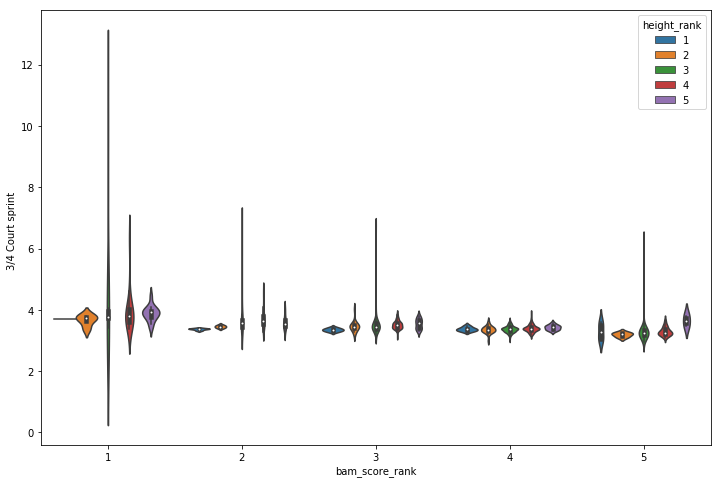

In [122]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='3/4 Court sprint  ',hue='height_rank',data=df)
plt.show()

### Violin Plots for bam_score_rank with respect to 4-Way agility

In [123]:
fig = px.violin(df, y="4-Way agility", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



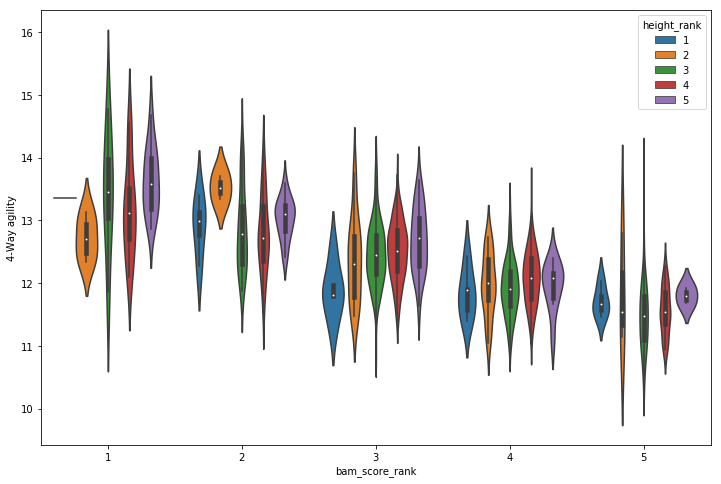

In [124]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='4-Way agility',hue='height_rank',data=df)
plt.show()

### Violin Plots for bam_score_rank with respect to Reaction Shuttle

In [125]:
fig = px.violin(df, y="Reaction Shuttle", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



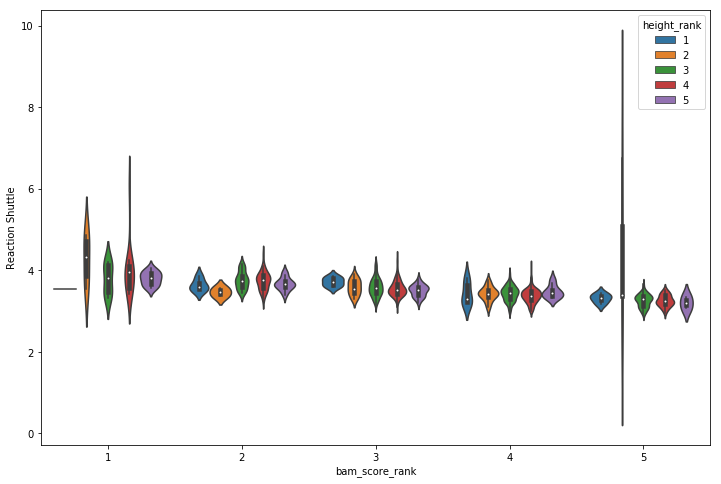

In [126]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Reaction Shuttle',hue='height_rank',data=df)
plt.show()

### Violin Plots for bam_score_rank with respect to Wingspan

In [127]:
fig = px.violin(df, y="Wingspan", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



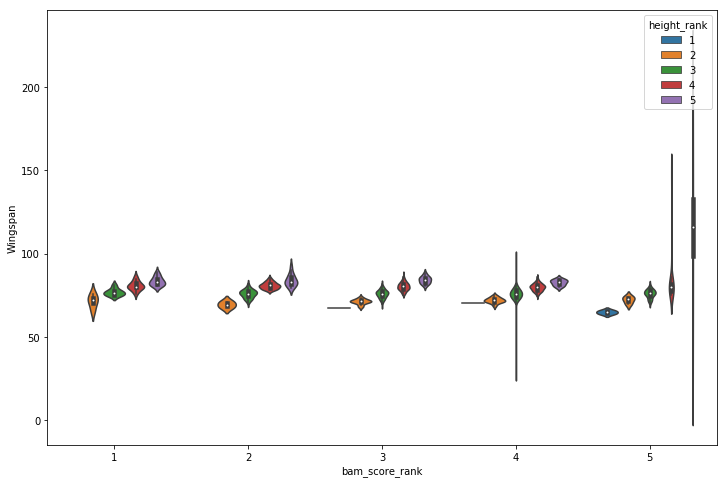

In [128]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Wingspan',hue='height_rank',data=df)
plt.show()

### Violin Plots for bam_score_rank with respect to Reach

In [129]:
fig = px.violin(df, y="Reach", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



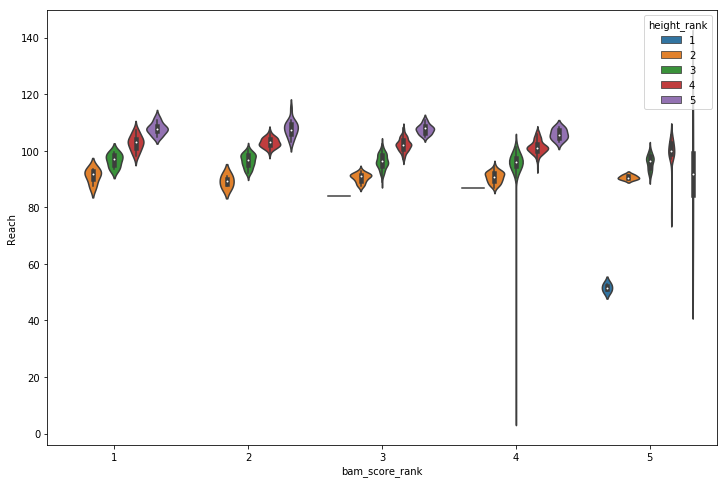

In [130]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Reach',hue='height_rank',data=df)
plt.show()

### Violin Plots for bam_score_rank with respect to Height

In [131]:
fig = px.violin(df, y="Height", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



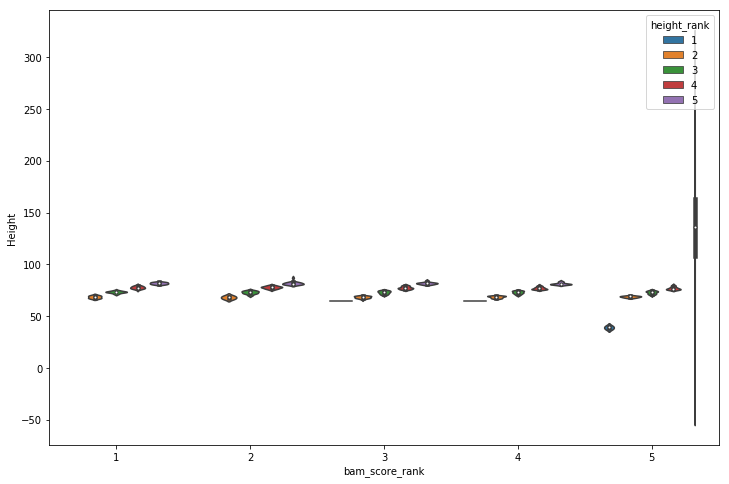

In [132]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Height',hue='height_rank',data=df)
plt.show()

### Violin Plots for bam_score_rank with respect to Weight

In [133]:
fig = px.violin(df, y="Weight", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



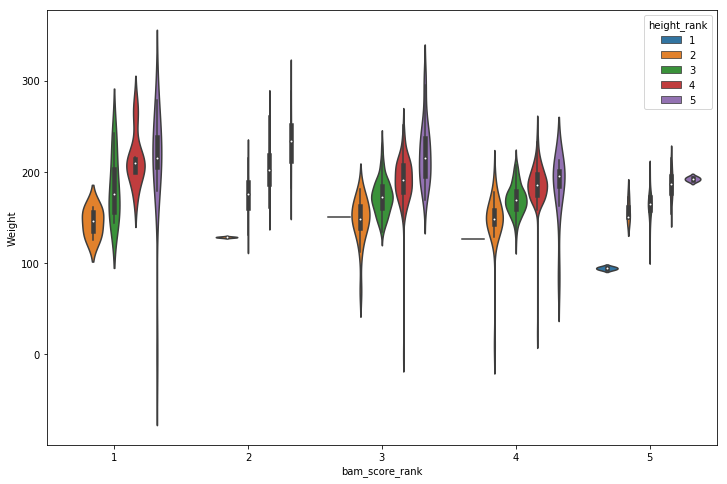

In [134]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Weight',hue='height_rank',data=df)
plt.show()

### Violin Plots for bam_score_rank with respect to Body Comp

In [135]:
fig = px.violin(df, y="Body Comp", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



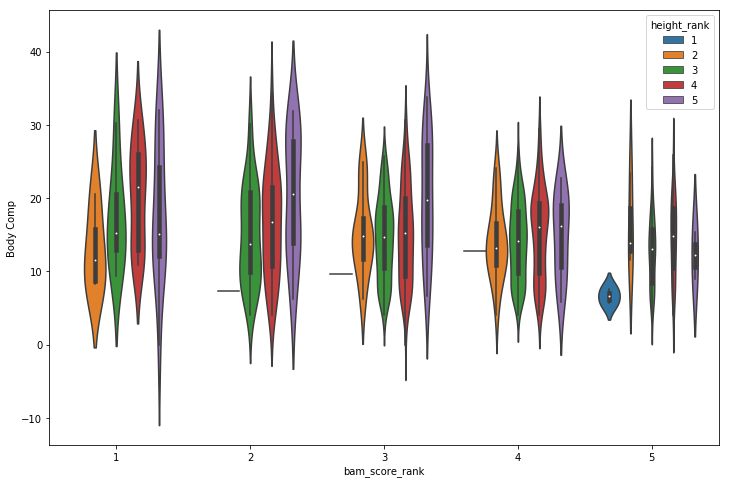

In [136]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Body Comp',hue='height_rank',data=df)
plt.show()

### Violin Plots for bam_score_rank with respect to Hand Width

In [137]:
fig = px.violin(df, y="Hand Width", x="bam_score_rank", color='height_rank',
                box=True, hover_data=df.columns)
fig.show()

//anaconda3/envs/learn-env/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



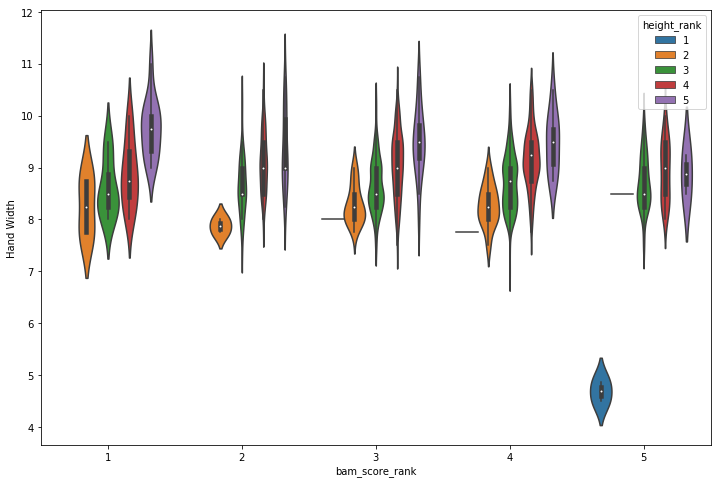

In [138]:
plt.figure(figsize = (12,8))
sns.violinplot(x='bam_score_rank', y='Hand Width',hue='height_rank',data=df)
plt.show()

## Jarque-Bera Test for each parameter
## Ran Jarque-Bera Test for each paramater
### Jarque-Bera test is a goodness-of-fit test thats tests whether the sample data has a skewness and kurtosis matching a normal distribution

In [139]:
# Reaction Shuttle threshold identifier

In [140]:
rs_mu = df['Reaction Shuttle'].mean()
rs_std = df['Reaction Shuttle'].std()
print(rs_mu, rs_std)
lower_95 = rs_mu-2*rs_std
df.shape, df[df['Reaction Shuttle']>4.5].shape

3.5052431640624997 0.2784274343866079


((1059, 25), (4, 25))

In [141]:
df.isna().sum()

BAMid                      2
Approach Vertical         73
Vertical Jump             40
3/4 Court sprint          41
4-Way agility             49
Reaction Shuttle          35
BAMScore                   3
Wingspan                  47
Reach                     47
Height                    47
Weight                    47
Body Comp                 47
Hand Width                50
approach_vertical_rank     0
vertical_jump_rank         0
reaction_shuttle_rank      0
bam_score_rank             0
wingspan_rank              0
reach_rank                 0
height_rank                0
weight_rank                0
body_comp_rank             0
hand_width_rank            0
fourway_rank               0
courtsprint_rank           0
dtype: int64

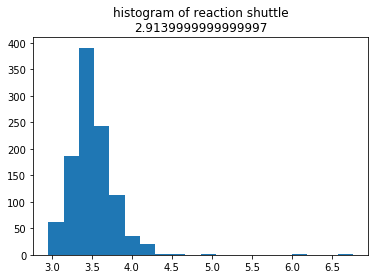

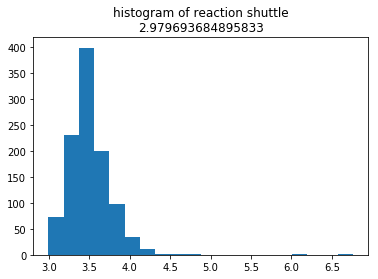

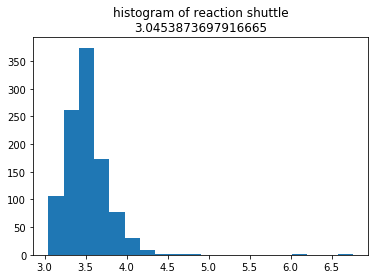

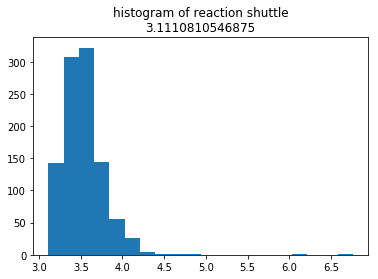

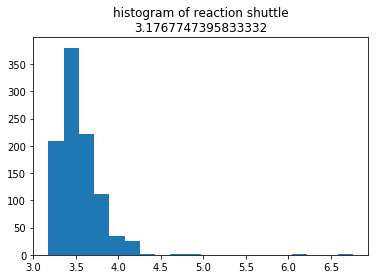

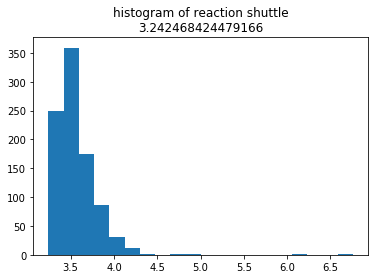

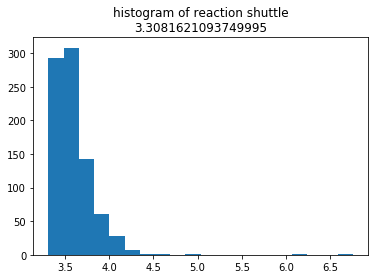

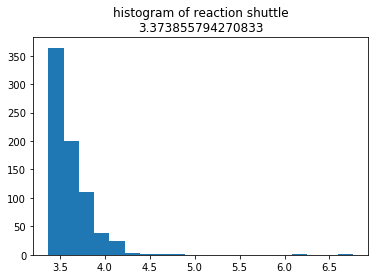

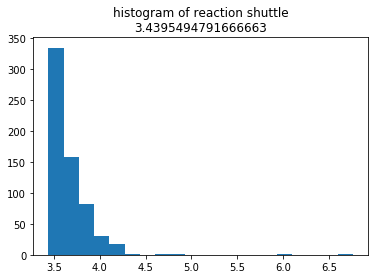

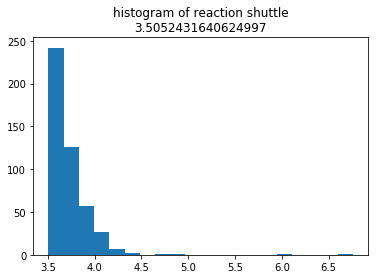

In [142]:
rs_min = df['Reaction Shuttle'].min()

jbs = []
thresholds = np.linspace(rs_min, rs_mu, 10)
for threshold in thresholds:
    vals = df[df['Reaction Shuttle'].fillna(rs_mu)>threshold]['Reaction Shuttle'].fillna(rs_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of reaction shuttle\n{}".format(threshold))
    plt.show()
    jb = scs.jarque_bera(vals)
    jbs.append(jb[0])

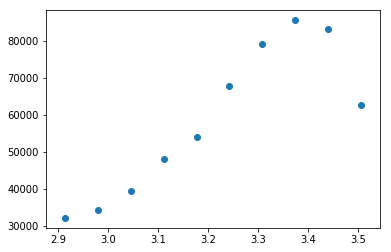

In [143]:
plt.scatter(thresholds, jbs)

In [144]:
# Conclusion - 2.914 threshold

In [145]:
# Threshold Identifier App Vert

In [146]:
av_mu = df['Approach Vertical'].mean()
av_std = df['Approach Vertical'].std()
print(av_mu, av_std)
lower_95 = av_mu-2*av_std
df.shape, df[df['Approach Vertical']>42].shape

31.829614604462474 3.5479850939588244


((1059, 25), (1, 25))

In [147]:
# Fix this #1

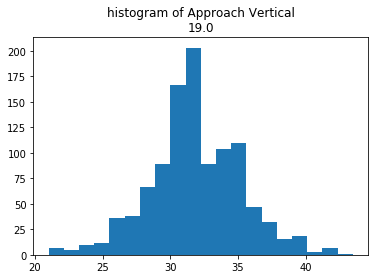

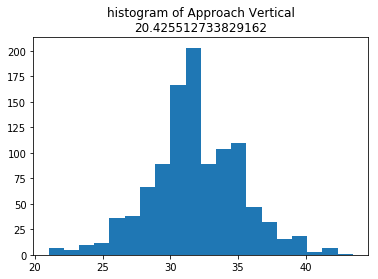

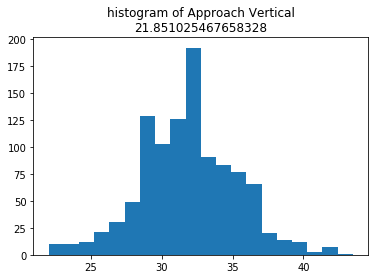

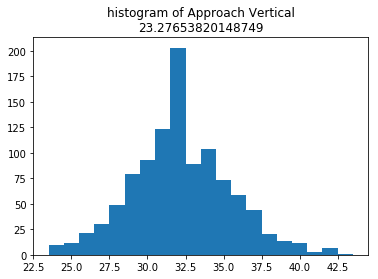

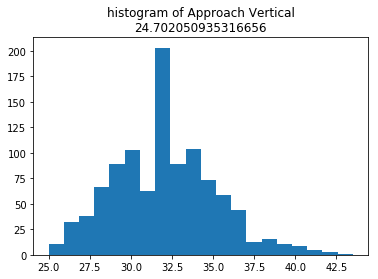

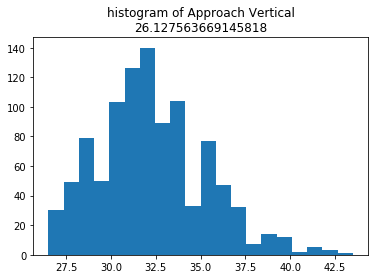

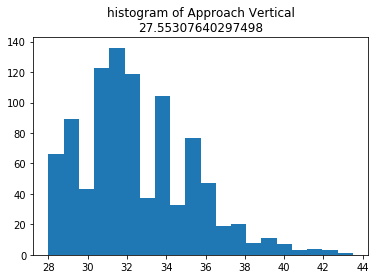

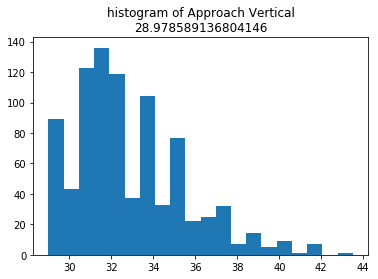

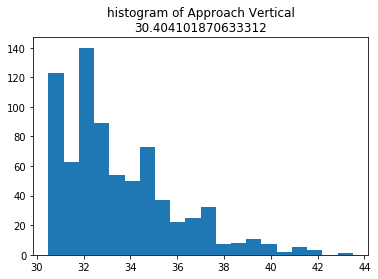

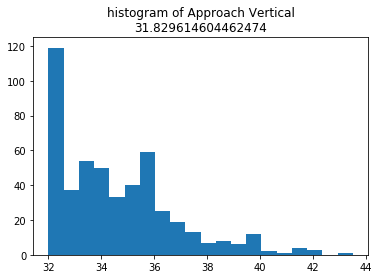

In [148]:
av_min = df['Approach Vertical'].min()

jbs_1 = []
thresholds = np.linspace(av_min, av_mu, 10)
for threshold in thresholds:
    vals = df[df['Approach Vertical'].fillna(av_mu)>threshold]['Approach Vertical'].fillna(av_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Approach Vertical\n{}".format(threshold))
    plt.show()
    jb_1=scs.jarque_bera(vals)
    jbs_1.append(jb_1[0])

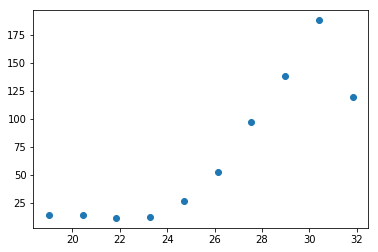

In [149]:
plt.scatter(thresholds, jbs_1)

In [150]:
# 3 Vertical Jump

In [151]:
vj_mu = df['Vertical Jump'].mean()
vj_std = df['Vertical Jump'].std()
print(vj_mu, vj_std)
lower_95 = vj_mu-2*vj_std
df.shape, df[df['Vertical Jump']>38].shape

25.860157016683022 3.1253011446061882


((1059, 25), (0, 25))

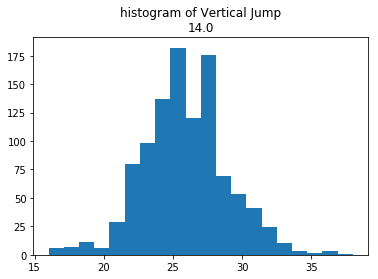

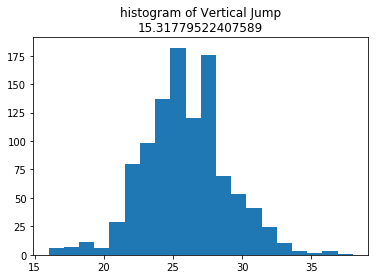

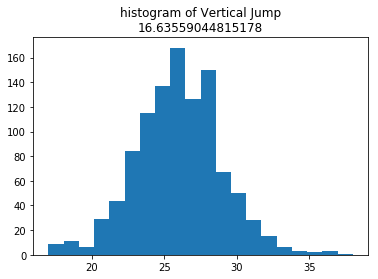

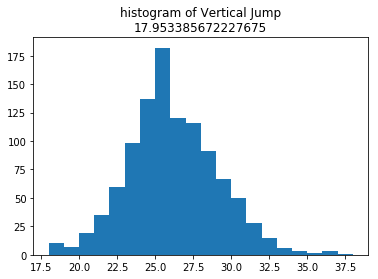

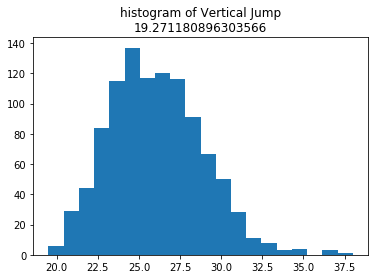

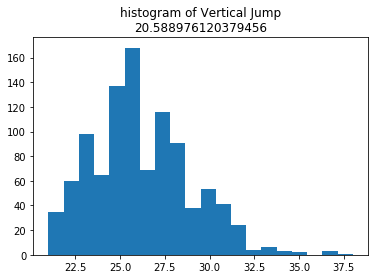

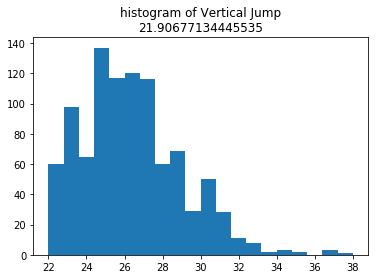

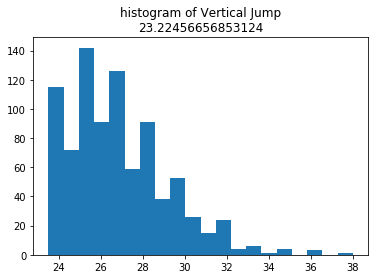

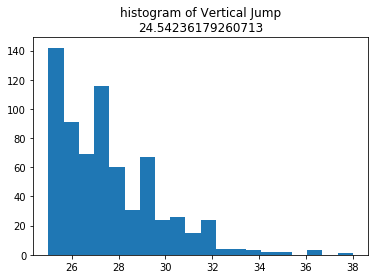

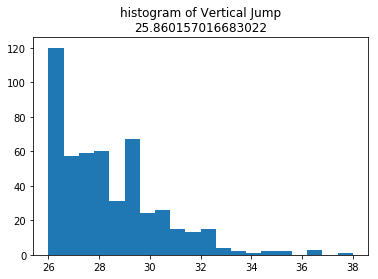

In [152]:
vj_min = df['Vertical Jump'].min()

jbs_2 = []
thresholds = np.linspace(vj_min, vj_mu, 10)
for threshold in thresholds:
    vals = df[df['Vertical Jump'].fillna(vj_mu)>threshold]['Vertical Jump'].fillna(vj_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Vertical Jump\n{}".format(threshold))
    plt.show()
    jb_2=scs.jarque_bera(vals)
    jbs_2.append(jb_2[0])

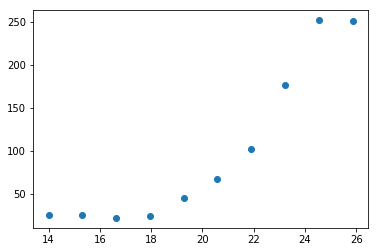

In [153]:
plt.scatter(thresholds, jbs_2)

In [154]:
# 4 3/4 court sprint

In [155]:
cs_mu = df['3/4 Court sprint  '].mean()
cs_std = df['3/4 Court sprint  '].std()
print(cs_mu, cs_std)
lower_95 = cs_mu-2*cs_std
df.shape, df[df['3/4 Court sprint  ']>5].shape

3.4670466601178784 0.3421985054646302


((1059, 25), (5, 25))

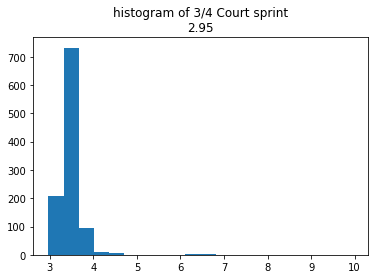

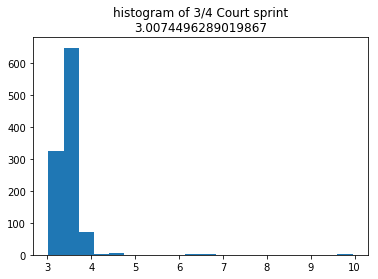

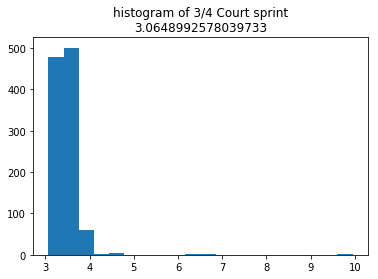

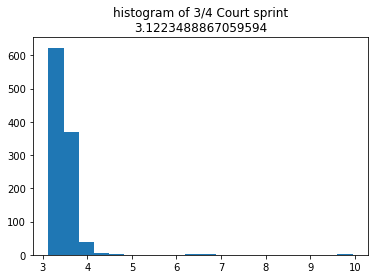

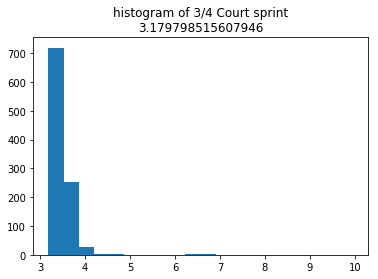

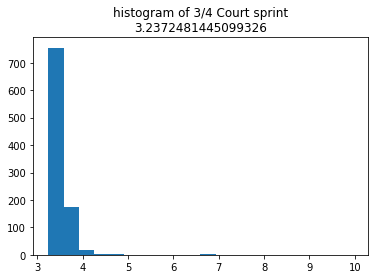

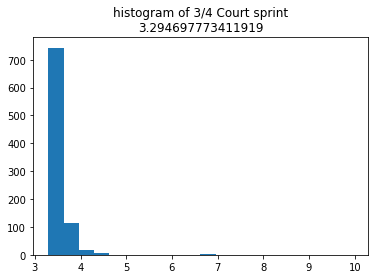

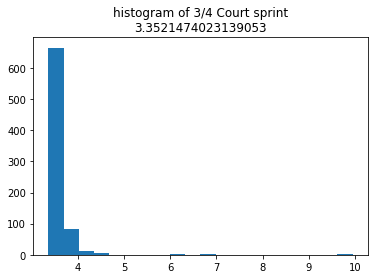

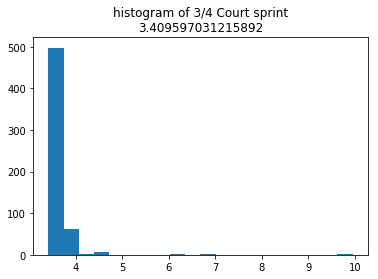

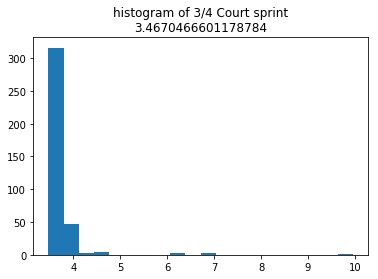

In [156]:
cs_min = df['3/4 Court sprint  '].min()

jbs_3 = []
thresholds = np.linspace(cs_min, cs_mu, 10)
for threshold in thresholds:
    vals = df[df['3/4 Court sprint  '].fillna(cs_mu)>threshold]['3/4 Court sprint  '].fillna(cs_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of 3/4 Court sprint\n{}".format(threshold))
    plt.show()
    jb_3=scs.jarque_bera(vals)
    jbs_3.append(jb_3[0])

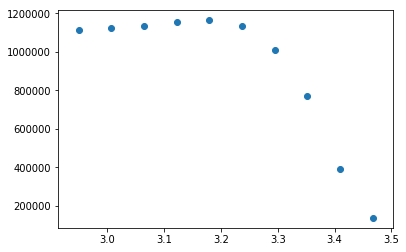

In [157]:
plt.scatter(thresholds, jbs_3)

In [158]:
# 5 4 way agility

In [159]:
wa_mu = df['4-Way agility'].mean()
wa_std = df['4-Way agility'].std()
print(wa_mu, wa_std)
lower_95 = wa_mu-2*wa_std
df.shape, df[df['4-Way agility']>14.25].shape

12.247189108910884 0.6683873176702257


((1059, 25), (5, 25))

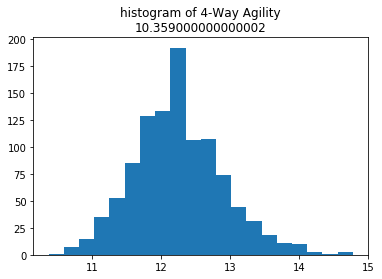

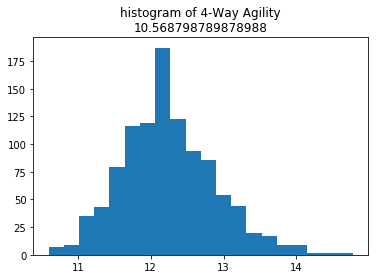

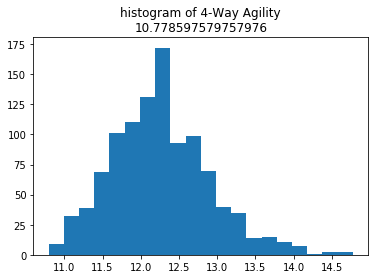

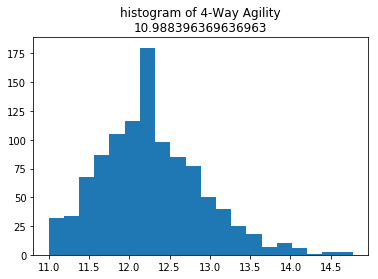

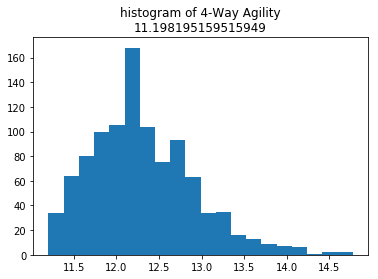

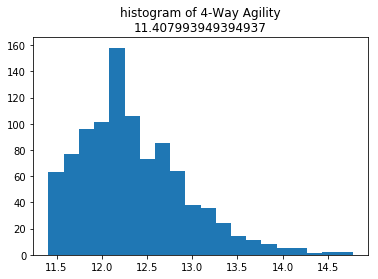

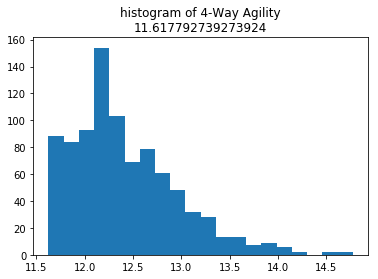

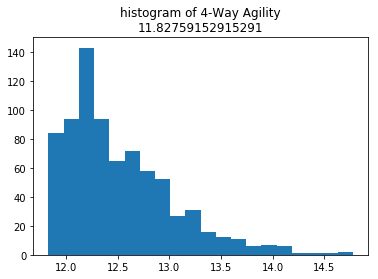

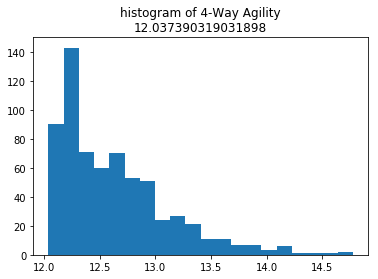

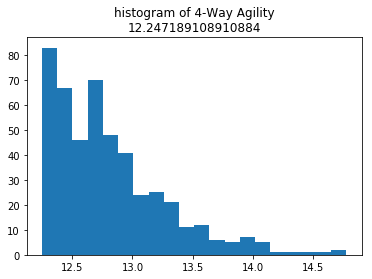

In [160]:
wa_min = df['4-Way agility'].min()

jbs_4 = []
thresholds = np.linspace(wa_min, wa_mu, 10)
for threshold in thresholds:
    vals = df[df['4-Way agility'].fillna(wa_mu)>threshold]['4-Way agility'].fillna(wa_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of 4-Way Agility\n{}".format(threshold))
    plt.show()
    jb_4=scs.jarque_bera(vals)
    jbs_4.append(jb_4[0])

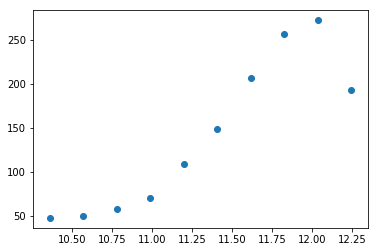

In [161]:
plt.scatter(thresholds, jbs_4)

In [162]:
#6 Wingspan

In [163]:
ws_mu = df['Wingspan'].mean()
ws_std = df['Wingspan'].std()
print(ws_mu, ws_std)
lower_95 = ws_mu-2*ws_std
df.shape, df[df['Wingspan']>100].shape

78.08979743083005 5.261419475728766


((1059, 25), (2, 25))

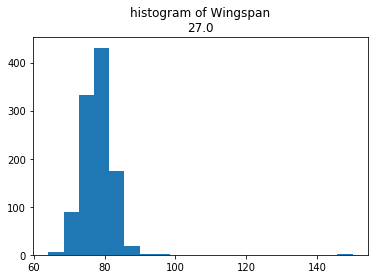

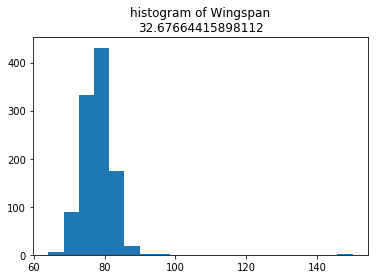

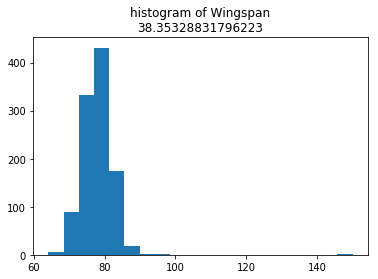

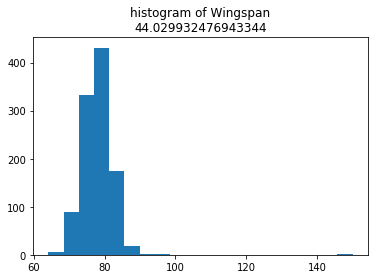

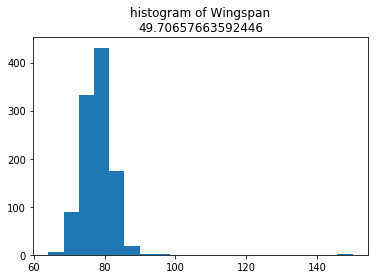

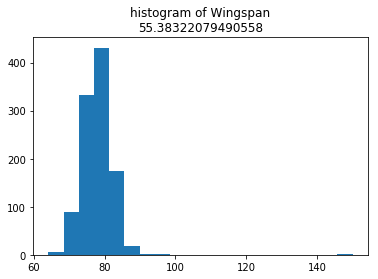

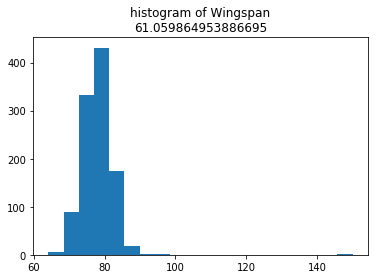

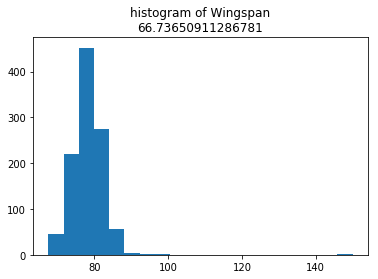

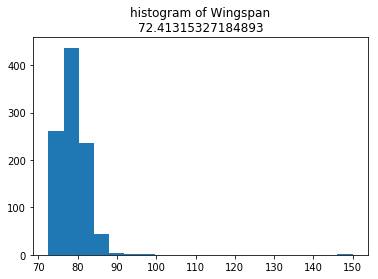

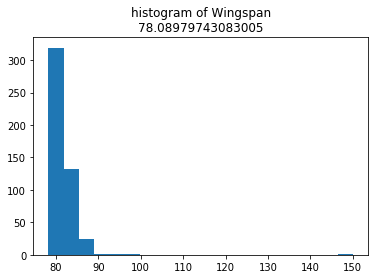

In [164]:
ws_min = df['Wingspan'].min()

jbs_5 = []
thresholds = np.linspace(ws_min, ws_mu, 10)
for threshold in thresholds:
    vals = df[df['Wingspan'].fillna(ws_mu)>threshold]['Wingspan'].fillna(ws_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Wingspan\n{}".format(threshold))
    plt.show()
    jb_5=scs.jarque_bera(vals)
    jbs_5.append(jb_5[0])

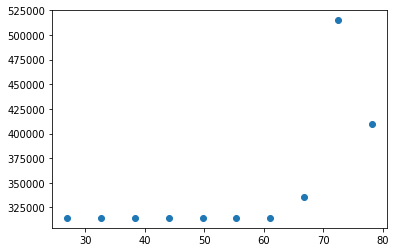

In [165]:
plt.scatter(thresholds, jbs_5)

In [166]:
#7 Reach

In [167]:
((df['Reach']>80)& (df['Reach']<115)).head()

0    True
1    True
2    True
3    True
4    True
Name: Reach, dtype: bool

In [168]:
re_mu = df['Reach'].mean()
re_std = df['Reach'].std()
print(re_mu, re_std)
lower_95 = re_mu-2*re_std
df.shape, df.loc[(df['Reach']>80) & (df['Reach']<115)].shape

98.71417984189723 5.95845856792728


((1059, 25), (1005, 25))

In [169]:
df.loc[df['Reach']>80]


# example of using .loc 

# df.loc[(df['Reach'] > 80) & (df['Reach'] < 115) & (df['Wingspan'] > 75)]

,BAMid,Approach Vertical,Vertical Jump,3/4 Court sprint,4-Way agility,Reaction Shuttle,BAMScore,Wingspan,Reach,Height,...,reaction_shuttle_rank,bam_score_rank,wingspan_rank,reach_rank,height_rank,weight_rank,body_comp_rank,hand_width_rank,fourway_rank,courtsprint_rank
0,1037,33.5,28.5,3.376,11.471,3.669,2003.0,72.75,94.0,70.00,...,4,4,2,3,3,3,3,3,2,3
1,656,30.5,21.5,3.486,12.114,3.355,1865.0,82.00,104.5,79.50,...,3,3,4,4,4,4,5,3,3,4
2,477,37.0,31.0,3.230,12.036,3.562,2005.0,81.50,99.0,74.00,...,4,4,4,4,3,4,3,4,3,3
3,1200,29.0,23.0,3.370,12.509,3.173,1902.0,79.50,101.0,77.50,...,2,4,4,4,4,4,3,4,4,3
4,1501,31.0,26.0,3.389,12.724,3.316,1903.0,77.00,101.5,78.00,...,3,4,3,4,4,3,4,5,4,3
6,1508,32.0,27.5,3.210,11.276,3.047,2088.0,73.00,92.0,70.00,...,2,5,3,2,3,2,3,2,2,3
7,730,34.0,26.5,3.513,11.743,3.726,1888.0,76.00,97.5,75.50,...,4,3,3,3,4,4,2,3,3,4
8,413,NaN,34.0,3.263,12.644,3.498,1932.0,76.00,95.5,73.00,...,3,4,3,3,3,3,4,3,4,3
9,1003,NaN,14.0,3.407,11.947,3.448,1709.0,83.00,102.0,76.50,...,3,2,4,4,4,4,5,4,3,3
10,1283,NaN,NaN,3.396,11.387,3.384,1922.0,75.00,95.5,73.00,...,3,4,3,3,3,4,4,3,2,3


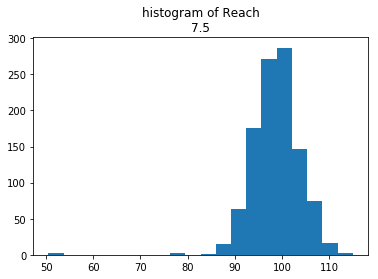

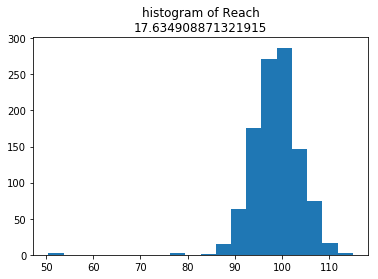

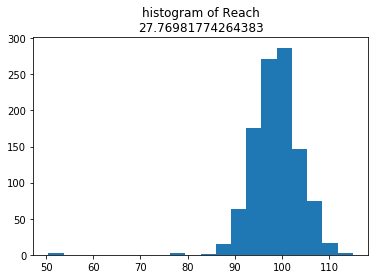

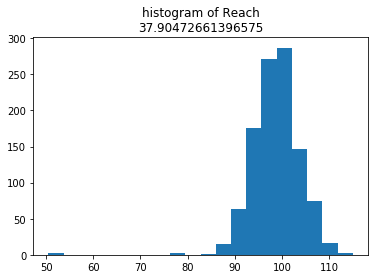

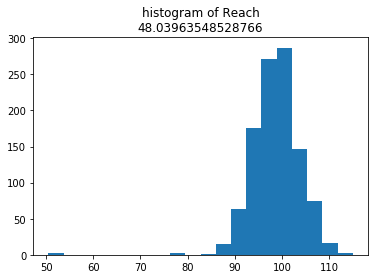

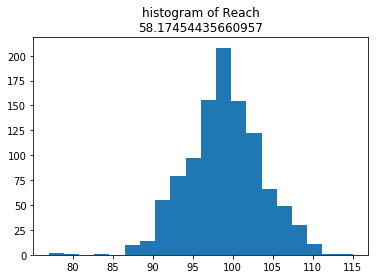

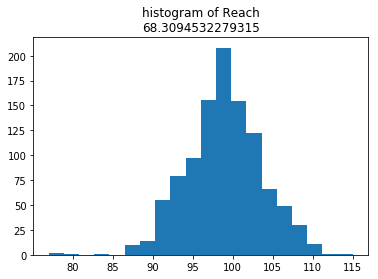

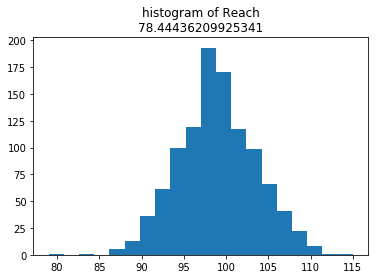

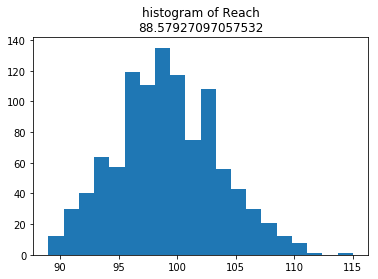

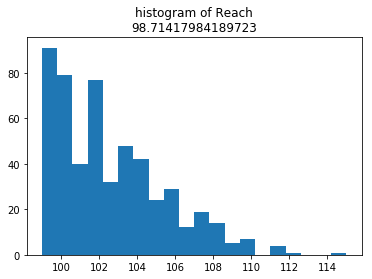

In [170]:
re_min = df['Reach'].min()

jbs_6 = []
thresholds = np.linspace(re_min, re_mu, 10)
for threshold in thresholds:
    vals = df[df['Reach'].fillna(re_mu)>threshold]['Reach'].fillna(re_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Reach\n{}".format(threshold))
    plt.show()
    jb_6=scs.jarque_bera(vals)
    jbs_6.append(jb_6[0])

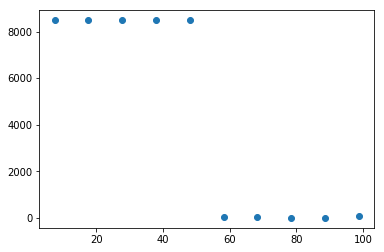

In [171]:
plt.scatter(thresholds, jbs_6)

In [172]:
#8 Height

In [173]:
ht_mu = df['Height'].mean()
ht_std = df['Height'].std()
print(ht_mu, ht_std)
lower_95 = ht_mu-2*ht_std
df.shape, df[df['Height']>87].shape

75.09419466403162 5.246044529301447


((1059, 25), (1, 25))

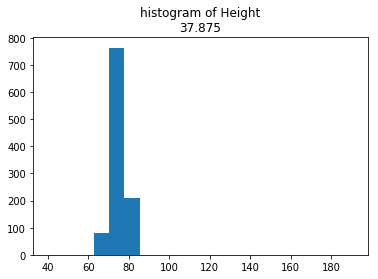

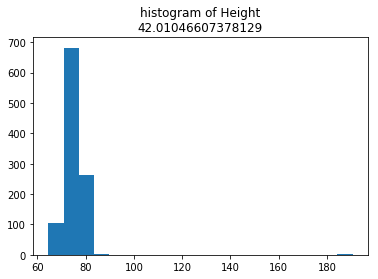

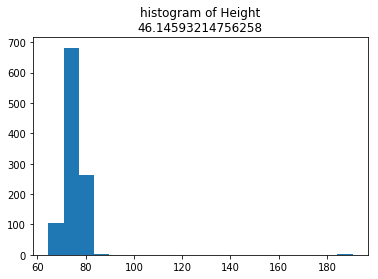

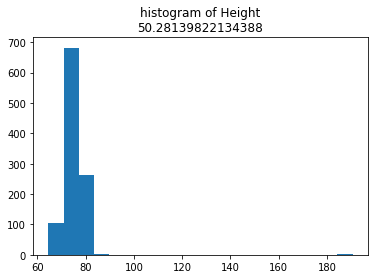

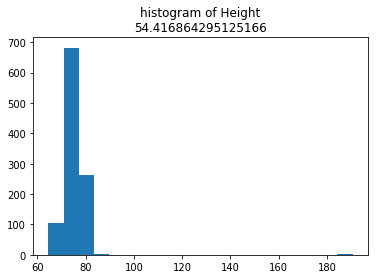

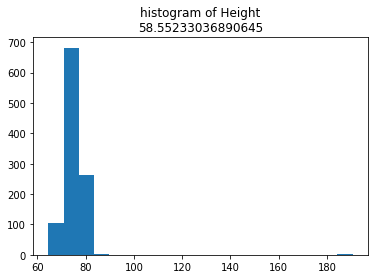

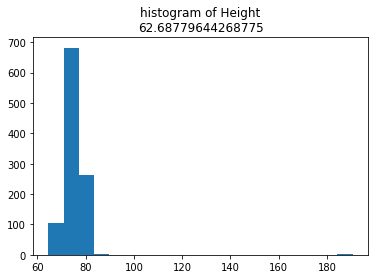

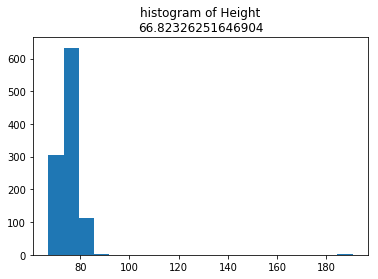

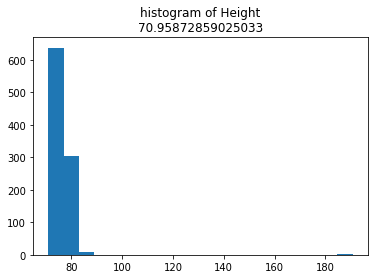

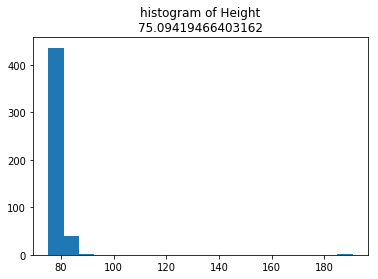

In [174]:
ht_min = df['Height'].min()

jbs_7 = []
thresholds = np.linspace(ht_min, ht_mu, 10)
for threshold in thresholds:
    vals = df[df['Height'].fillna(ht_mu)>threshold]['Height'].fillna(ht_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Height\n{}".format(threshold))
    plt.show()
    jb_7=scs.jarque_bera(vals)
    jbs_7.append(jb_7[0])

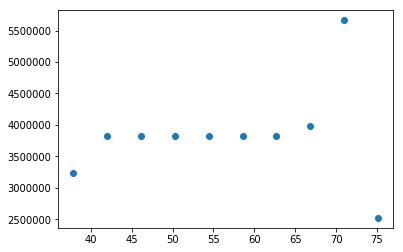

In [175]:
plt.scatter(thresholds, jbs_7)

In [176]:
#9 Weight

In [177]:
wt_mu = df['Weight'].mean()
wt_std = df['Weight'].std()
print(av_mu, av_std)
lower_95 = wt_mu-2*wt_std
df.shape, df[df['Weight']>280].shape

31.829614604462474 3.5479850939588244


((1059, 25), (4, 25))

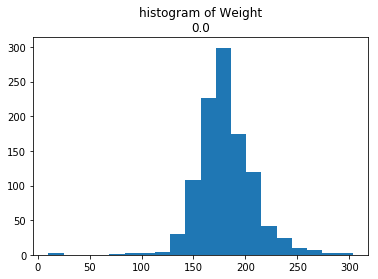

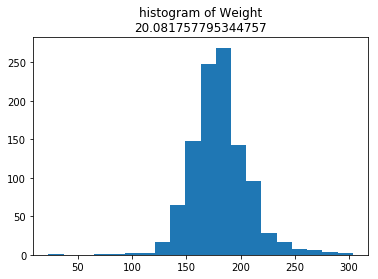

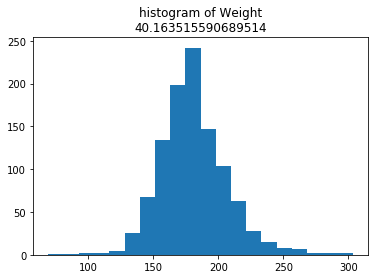

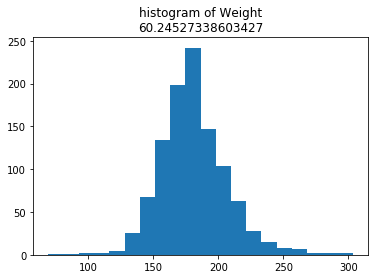

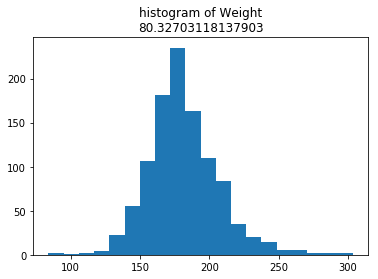

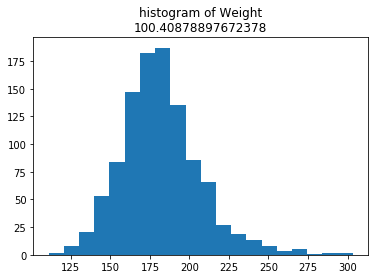

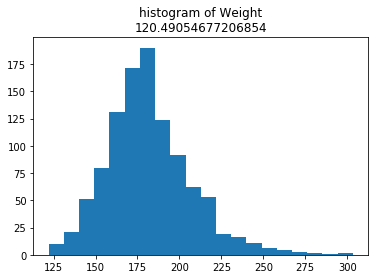

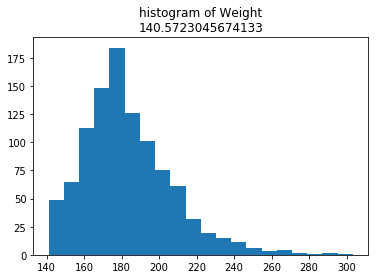

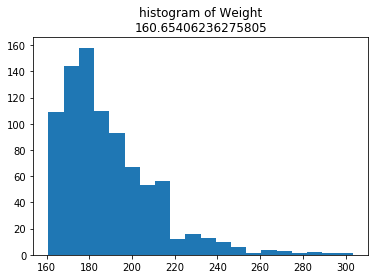

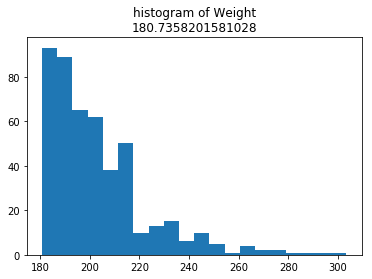

In [178]:
wt_min = df['Weight'].min()

jbs_8 = []
thresholds = np.linspace(wt_min, wt_mu, 10)
for threshold in thresholds:
    vals = df[df['Weight'].fillna(wt_mu)>threshold]['Weight'].fillna(wt_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Weight\n{}".format(threshold))
    plt.show()
    jb_8=scs.jarque_bera(vals)
    jbs_8.append(jb_8[0])

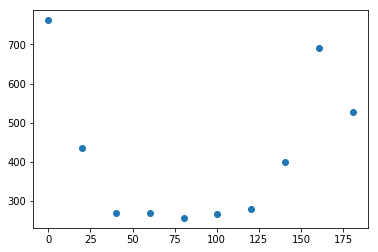

In [179]:
plt.scatter(thresholds, jbs_8)

In [180]:
#10 Body Comp

In [181]:
bc_mu = df['Body Comp'].mean()
bc_std = df['Body Comp'].std()
print(bc_mu, bc_std)
lower_95 = bc_mu-2*bc_std
df.shape, df[df['Body Comp']>33].shape

14.97949604743083 6.191146804644591


((1059, 25), (2, 25))

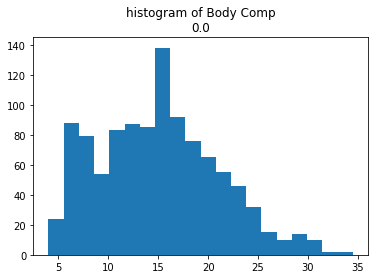

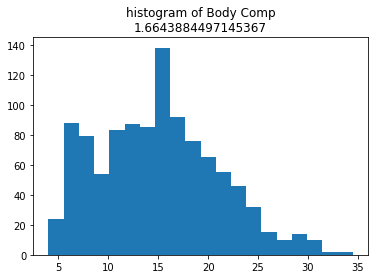

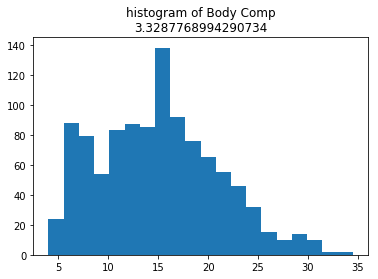

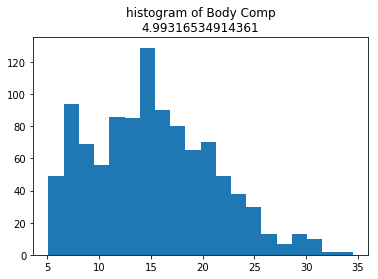

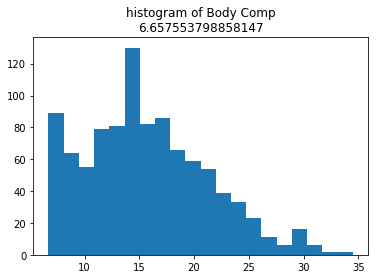

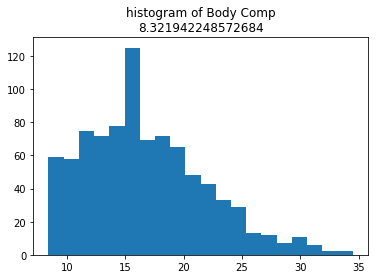

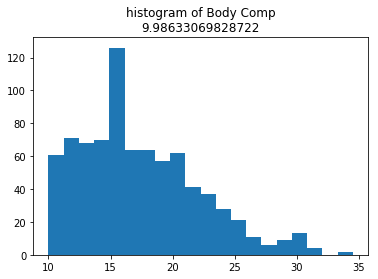

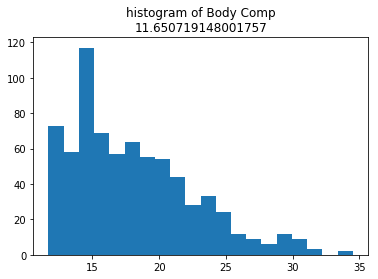

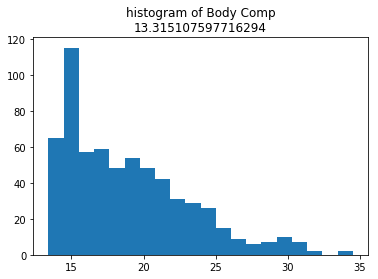

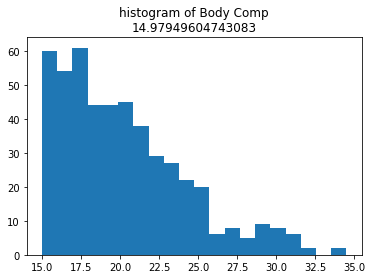

In [182]:
bc_min = df['Body Comp'].min()

jbs_9 = []
thresholds = np.linspace(bc_min, bc_mu, 10)
for threshold in thresholds:
    vals = df[df['Body Comp'].fillna(bc_mu)>threshold]['Body Comp'].fillna(bc_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Body Comp\n{}".format(threshold))
    plt.show()
    jb_9=scs.jarque_bera(vals)
    jbs_9.append(jb_9[0])

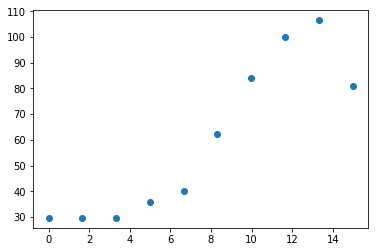

In [183]:
plt.scatter(thresholds, jbs_9)

In [184]:
# 11 Hand Width

In [185]:
hw_mu = df['Hand Width'].mean()
hw_std = df['Hand Width'].std()
print(hw_mu, hw_std)
lower_95 = hw_mu-2*hw_std
df.shape, df[df['Hand Width']>11].shape

8.876189296333004 0.6540954411061081


((1059, 25), (0, 25))

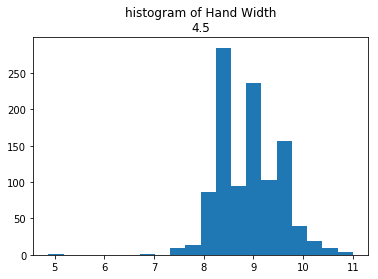

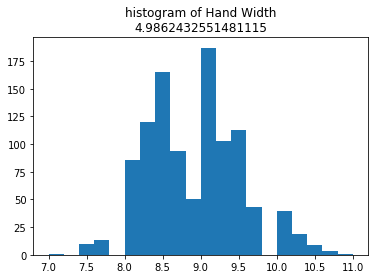

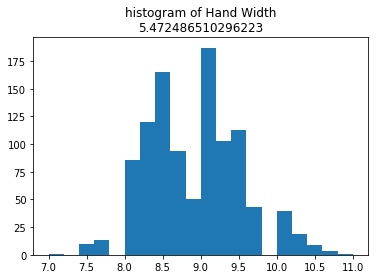

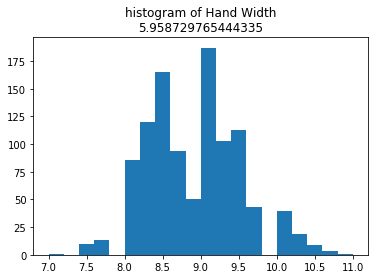

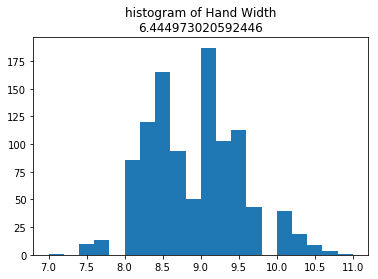

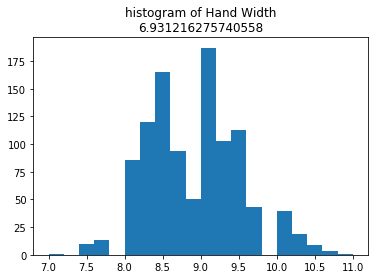

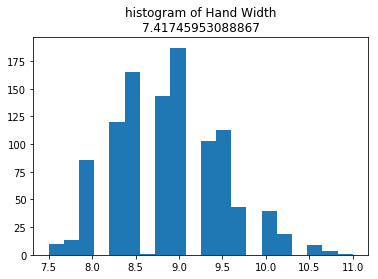

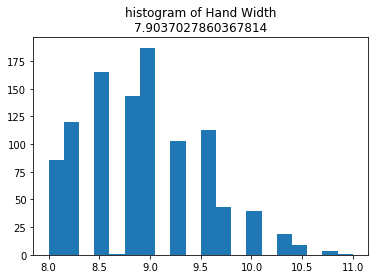

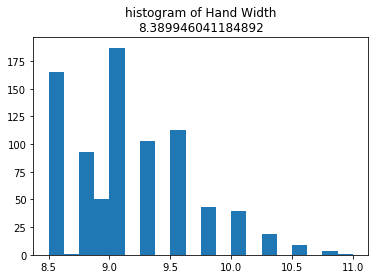

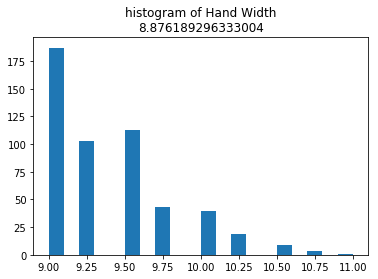

In [186]:
hw_min = df['Hand Width'].min()

jbs_10 = []
thresholds = np.linspace(hw_min, hw_mu, 10)
for threshold in thresholds:
    vals = df[df['Hand Width'].fillna(hw_mu)>threshold]['Hand Width'].fillna(hw_mu)
    plt.hist(vals, bins=20)
    plt.title("histogram of Hand Width\n{}".format(threshold))
    plt.show()
    jb_10=scs.jarque_bera(vals)
    jbs_10.append(jb_10[0])

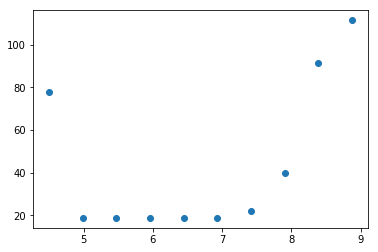

In [187]:
plt.scatter(thresholds, jbs_10)

## K Nearest Neighbor Classifier

In [188]:
df.columns

Index(['BAMid', 'Approach Vertical', 'Vertical Jump', '3/4 Court sprint  ',
       '4-Way agility', 'Reaction Shuttle', 'BAMScore', 'Wingspan', 'Reach',
       'Height', 'Weight', 'Body Comp', 'Hand Width', 'approach_vertical_rank',
       'vertical_jump_rank', 'reaction_shuttle_rank', 'bam_score_rank',
       'wingspan_rank', 'reach_rank', 'height_rank', 'weight_rank',
       'body_comp_rank', 'hand_width_rank', 'fourway_rank',
       'courtsprint_rank'],
      dtype='object')

In [189]:
x.isna().sum()

Approach Vertical     0
Vertical Jump         0
3/4 Court sprint      0
4-Way agility         0
Reaction Shuttle      0
Wingspan              0
Reach                 0
Height                0
Weight                0
Body Comp             0
Hand Width            0
dtype: int64

In [190]:
df.mean()

# Just to check that we have all means for columns

Approach Vertical           31.829615
Vertical Jump               25.860157
3/4 Court sprint             3.467047
4-Way agility               12.247189
Reaction Shuttle             3.505243
BAMScore                  1890.976326
Wingspan                    78.089797
Reach                       98.714180
Height                      75.094195
Weight                     180.735820
Body Comp                   14.979496
Hand Width                   8.876189
approach_vertical_rank       3.324835
vertical_jump_rank           3.406988
reaction_shuttle_rank        3.372993
bam_score_rank               3.479698
wingspan_rank                3.339943
reach_rank                   3.414542
height_rank                  3.366383
weight_rank                  3.362606
body_comp_rank               3.372993
hand_width_rank              3.385269
fourway_rank                 3.346553
courtsprint_rank             3.306893
dtype: float64

In [191]:
df.fillna(value=df.mean(), inplace=True)

# Inplace = true does it permanently, false does not

In [192]:
x = df[['Reaction Shuttle','4-Way agility', 'Vertical Jump','3/4 Court sprint  ']]
y = df[['BAMScore']]

# Add more x param to increase r2 score

In [193]:
from sklearn.model_selection import train_test_split

#https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html

In [194]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.10)

In [195]:
display(x.head(2))
display(x_train.head(2))
display(x_test.head(2))

# 

,Reaction Shuttle,4-Way agility,Vertical Jump,3/4 Court sprint
0,3.669,11.471,28.5,3.376
1,3.355,12.114,21.5,3.486


,Reaction Shuttle,4-Way agility,Vertical Jump,3/4 Court sprint
323,3.373,11.805,26.0,3.386
870,3.261,12.292,26.5,3.274


,Reaction Shuttle,4-Way agility,Vertical Jump,3/4 Court sprint
280,3.419,11.486,26.5,3.406
559,3.182,11.708,27.0,3.158


In [196]:
from sklearn.neighbors import KNeighborsClassifier,KNeighborsRegressor
neigh = KNeighborsRegressor(n_neighbors=3)
neigh.fit(x_train, y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=3, p=2,
                    weights='uniform')

In [197]:
neigh.score(x_test, y_test)

0.710751978890855

## Decision Tree Regressor

In [198]:
from sklearn.tree import DecisionTreeRegressor # Import Decision Tree Regressor
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

# https://www.datacamp.com/community/tutorials/decision-tree-classification-python

In [199]:
feature_cols = ['Approach Vertical', 'Vertical Jump', '3/4 Court sprint  ',
       '4-Way agility', 'Reaction Shuttle', 'Wingspan', 'Reach',
       'Height', 'Weight', 'Body Comp', 'Hand Width']
x = df[feature_cols] # Features
y = df.BAMScore

In [200]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=1)
# 70% training and 30% test

In [201]:
# Create Decision Tree Regressor object
clf = DecisionTreeRegressor()

# Train Decision Tree Classifer
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [202]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",clf.score(x_test,y_test))

Accuracy: 0.6845204245526674


### Code to remove outliers from Height and Weight Catagories

In [203]:
#df.describe()

In [204]:
#df.loc[df['Weight']>0].describe()

In [205]:
#df.loc[df['Height']>100.0]

In [206]:
#df_no_outlier = df.loc[df['Height']<100.0]

In [207]:
#pd.plotting.scatter_matrix(df_no_outlier, figsize=(20,20))
#plt.show()

In [208]:
#df.loc[df['Height']<60.0]

In [222]:
!pwd

/Users/bryandouglasjamieson/flatiron/BAM


## Notes for Martin 1/29